In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True) # My Drive
# Change to your local path if needed
import os
path = '/content/gdrive/My Drive/Biofacenet_n'
os.chdir(path)

Mounted at /content/gdrive


In [ ]:
!nvidia-smi

Tue Oct 12 18:36:05 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.74       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    24W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import torch
import torch.nn.functional as F
import scipy.io as io
import torch.nn as nn
import time, os, sys, math
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.utils.data as utils
from torch.utils.data import Dataset, TensorDataset
import torchvision
import torchvision.transforms as transforms
# from CustomTensorDataset import *
# from model import *
# from helpers import *
# from Utils import *
import numpy as np
import argparse
from matplotlib import cm
from sklearn.decomposition import PCA

# Copy data


In [ ]:
# !cp ./SfSNet_pytorch/ubfc_sfsnet.bin /content/ubfc_sfsnet.bin # Copy

In [ ]:
# !cp ./SfSNet_pytorch/celebA_test.bin /content/celebA_test.bin # Copy

In [ ]:
# !cp ./DECA/celebAHQ_deca_albedo_5000.bin /content/celebAHQ_deca_albedo_5000.bin

In [ ]:
# !cp ./DECA/PPB_deca_albedo_1270_256.bin /content/PPB_deca_albedo_1270_256.bin

# data link: https://drive.google.com/file/d/1oL_MudLxv5tFWxpEprx1t33ebNynrf8C/view?usp=share_link
!cp ./DECA/bupt_balancedface_deca_albedo_3000_256.bin /content/bupt_balancedface_deca_albedo_3000_256.bin

# Helper


In [ ]:
def scalingNet(lightingparameters,b,fmel,fblood,Shading,specmask,bSize=2):
  '''
  Inputs:
      lightingparameters              :   [N,15]
      b                               :   [N,2]  
      fmel,fblood,Shading,specmask    :   [N,H,W]
  Outputs:
      weightA, weightD                :   [N]
      CCT                             :   [N]
      Fweights                        :   [N,12]
      b, BGrid                        :   [N,2]  
      fmel,fblood,Shading,specmask    :   [N,H,W]
  '''
  lightingweights = F.softmax(lightingparameters[:,0:14],1) # [N,14]
  weightA = lightingweights[:,0] # [N]
  weightD = lightingweights[:,1]
  Fweights = lightingweights[:,2:14] # [N,12]
  CCT = lightingparameters[:,14] # [N]
  CCT = (21/(1 + torch.exp(-CCT))) # scale [0-21] since 0 indexing
  
  b = 6*torch.sigmoid(b) - 3 # Remove range constraint
  BGrid =  b/3.0  #

  # fmel = 2*torch.sigmoid(fmel)-1 # Remove range constraint
  # fblood = 2*torch.sigmoid(fblood)-1 # Remove range constraint
  # fblood = (torch.tanh(fblood) + 1) / 40 + 0.02 # 0.02 - 0.07
  # fmel = (torch.tanh(fmel) + 1) / 4 # 0 - 0.5
  fblood = torch.tanh(fblood)
  fmel = torch.tanh(fmel)

  Shading = torch.exp(Shading)
  specmask = torch.exp(specmask)

  return weightA,weightD,CCT,Fweights,b,BGrid,fmel,fblood,Shading,specmask


def cameraModel_modified(mu,PC,rgbCMF,b,wavelength):
    '''
    Inputs:
        mu         :  [99,1]
        PC         :  [99,2]
        b          :  [N,2] 
    Outputs:
        Sr,Sg,Sb   :  [N,33]
    '''
    N = b.shape[1]
    # PCA model
    S = mu + torch.matmul(PC,b.T)  # [99,N]
    S =  F.relu(S) 
    
    Sr = S[0:wavelength].permute(1,0)  # [33,N] -> [N,33]           
    Sg = S[wavelength:wavelength*2].permute(1,0)
    Sb = S[wavelength*2:wavelength*3].permute(1,0)

    # S = rgbCMF
    # Sr = S[0, 0].unsqueeze(0).repeat(b.shape[0], 1)  # [33,N] -> [N,33]           
    # Sg = S[0, 1].unsqueeze(0).repeat(b.shape[0], 1)
    # Sb = S[0, 2].unsqueeze(0).repeat(b.shape[0], 1)
    # print(S[0, 0])
    return Sr,Sg, Sb

def illuminationModel_modified(weightA,weightD,Fweights,CCT,illumA,illumDNorm,illumFNorm):
    '''
    Inputs:
        weightA, weightD                :   [N]
        Fweights                        :   [N,12]
        CCT                             :   [N]
        illumA                          :   [33]
        illumDNorm                      :   [33,22]
        illumFNorm                      :   [33,12]
    Output:
        e                               :   [N,33]
    '''
    N = weightA.numel()
    
# illumination A:
    illuminantA = weightA.view(-1,1)*illumA.view(1,-1) # [N,33] = [N,1]*[1,33]
    # illuminantA = illumA.view(1,-1).repeat(N, 1) # using constant illuminant for all images
    # print(illumA)

# illumination D:
    illumDNorm = illumDNorm.view(1,1,33,22)
    grid = torch.zeros(N,1,33,2).to(illumDNorm.device)
    grid[:,0,:,0] = (2*CCT/21-1).view(N,1)
    grid[:,0,:,1]=torch.tensor([-1+i*(2/32) for i in range(33)]) # [N,33] <- [33]
    illumD = F.grid_sample(illumDNorm.expand(N,-1,-1,-1), grid, align_corners=True).squeeze() # [N,1,1,33] -> [N,33]
    illuminantD = weightD.view(-1,1) * illumD # [N,33] = [N,1] * [N,33]

# illumination F:
    illumFNorm = illumFNorm.view(33,12,1)
    Fweights = Fweights.permute(1,0) # [12,N]
    illuminantF = illumFNorm*Fweights 
    illuminantF = illuminantF.sum(1).permute(1,0) # [33,12,N] -> [33,N] -> [N,33]

    e = illuminantA + illuminantD + illuminantF 
    e = e/e.sum(1, keepdim=True)

    return e


def computelightcolour(e,Sr,Sg,Sb):
  '''
  Inputs:
      Sr,Sg,Sb         : [N,33]
      e                : [N,33]
  Output:
      lightcolour      : [N,3]
  '''
  lightcolour = torch.stack([(Sr*e).sum(1), (Sg*e).sum(1), (Sb*e).sum(1)],1)
  # print('light color', lightcolour[0])
  return lightcolour


def computeSpecularities(specmask,lightcolour):
  '''
  Inputs:
      specmask         : [N,H,W]
      lightcolour      : [N,3]
  Output:
      Specularities    : [N,3,H,W]
  '''
  specmask = specmask.unsqueeze(1) # [N,1,H,W]
  Specularities = specmask*lightcolour.view(-1,3,1,1) # [N,3,H ,W] = [N,1,H,W ] * [N,3,1,1]

  return Specularities


def BiotoSpectralRef(fmel,fblood,Newskincolour):
  '''
  Inputs:
      fmel,fblood      : [N,H,W]
      Newskincolour    : [1,33,256,256]
  Output:
      R_total          : [N,33,H,W]
  '''
  N = fmel.shape[0]
  BiophysicalMaps =   torch.cat([fmel.unsqueeze(1),fblood.unsqueeze(1)], dim=1) # [N,2,H,W]   
  BiophysicalMaps =   BiophysicalMaps.permute(0,2,3,1)  # [N,H,W,2], grid
  Newskincolour = Newskincolour.expand(N,-1,-1,-1) # [N,33,256,256]
  R_total  = F.grid_sample(Newskincolour, BiophysicalMaps, align_corners=True)
  # print(R_total.shape)
  # R_total = Newskincolour
  return R_total


def ImageFormation (R_total, Sr,Sg,Sb,e,Specularities,Shading):
  '''
  Inputs:
      R_total          : [N,33,H,W]
      Sr,Sg,Sb,e       : [N,33]
      Specularities    : [N,3,H,W]
      Shading          : [N,H,W]
  Output:
      rawAppearance, diffuseAlbedo : [N,3,H,W]
  ''' 
  # N = e.shape[0]
  e = e * 3
  spectraRef = R_total*e.view(-1,33,1,1) # N x 33 x H x W
  rChannel = (spectraRef*Sr.view(-1,33,1,1)).sum(1,keepdim=True)
  # print('rChannel', rChannel[0])
  gChannel = (spectraRef*Sg.view(-1,33,1,1)).sum(1,keepdim=True)
  bChannel = (spectraRef*Sb.view(-1,33,1,1)).sum(1,keepdim=True) # [N,1,H,W]

  diffuseAlbedo = torch.cat([rChannel,gChannel,bChannel], dim=1) # [N,3,H,W]
  ShadedDiffuse = diffuseAlbedo*(Shading.unsqueeze(1)) # [N,3,H,W] = [N,3,H,W] * [N,1,H,W]
  rawAppearance = ShadedDiffuse + Specularities

  return rawAppearance, diffuseAlbedo


def WhiteBalance(rawAppearance,lightcolour):
  '''
  Inputs:
      rawAppearance    : [N,3,H,W]
      lightcolour      : [N,3]
  Output:
      ImwhiteBalanced  : [N,3,H,W]
  '''
  ImwhiteBalanced = rawAppearance/lightcolour.view(-1,3,1,1) # [N,3,H,W] = [N,3,H,W] / [N,3,1,1]

  return ImwhiteBalanced


def findT(Tmatrix,BGrid):
  '''
  Inputs:
      Tmatrix          : [1,9,128,128]
      BGrid            : [N,2]
  Output:
      T_RAW2XYZ        : [N,9]
  '''
  N = BGrid.shape[0]
  T_RAW2XYZ = F.grid_sample(Tmatrix.expand(N,-1,-1,-1), BGrid.view(N,1,1,2), align_corners=True).squeeze() # [N,9,1,1] -> [N,9]
  # T_RAW2XYZ = torch.tensor([0.2656, 0.1325, 0.0314, 0.0064, 0.2475, -0.1098, 0.0533, -0.0374, 0.4507]).to(device)
  # T_RAW2XYZ = T_RAW2XYZ.expand(N, -1)

  return T_RAW2XYZ


def fromRawTosRGB(imWB,T_RAW2XYZ,Txyzrgb):
  '''
  Inputs:
      imWB             : [N,3,H,W]
      T_RAW2XYZ        : [N,9]
      Txyzrgb          : [N,9]
  Output:
      T_RAW2XYZ        : [N,9]
  '''
  T_R2X = T_RAW2XYZ.view(-1,3,3,1,1) # [[1,2,3],[4,5,6],[7,8,9]]
  Ix = (T_R2X[:,:,0] * imWB).sum(1) # [N,3,1,1] * [N,3,H,W] -> [N,3,H,W] -> [N,H,W]
  Iy = (T_R2X[:,:,1] * imWB).sum(1)
  Iz = (T_R2X[:,:,2] * imWB).sum(1)

  Ixyz = torch.stack([Ix,Iy,Iz],1) # [N,3,H,W]

  R = (Txyzrgb[0,:].view(-1,1,1) * Ixyz).sum(1) # [3,1,1] * [N,3,H,W] -> [N,3,H,W] -> [N,H,W]
  G = (Txyzrgb[1,:].view(-1,1,1) * Ixyz).sum(1)
  B = (Txyzrgb[2,:].view(-1,1,1) * Ixyz).sum(1)

  sRGBim = torch.stack([R,G,B],1) # [N,3,H,W]
  sRGBim =F.relu(sRGBim)

  return sRGBim


def priorLoss(b, weight):
  loss = (b*b).sum()
  return loss*weight


def appearanceLoss(rgbim, images, muim, weight):
  rgb = rgbim - muim.view(-1,1,1)
  delta = images - rgb
  loss = (delta*delta).sum()
  return loss*weight


def sparsityLoss(Specularities, weight):
  #L1 sparsity loss
  loss = Specularities.sum()
  return loss*weight


def shadingLoss(actualshading, predictedShading, actualmasks, weight):
  '''
  Inputs:
      actualshading, predictedShading : [N,H,W]
      actualmasks                     : [N,H,W] 
  '''
  scale = ((actualshading*predictedShading)*actualmasks).sum(2).sum(1)/((predictedShading**2)*actualmasks).sum(2).sum(1)  # [N]

  predictedShading = predictedShading*scale.view(-1,1,1)
  alpha = (actualshading - predictedShading)*actualmasks
  loss = (alpha**2).sum()
  return loss*weight

def cstretch(img, a=0., b=1.):
  '''
  contrast stretch numpy image
  '''
  if len(img.shape) == 2:
    c = np.min(img)
    d = np.max(img)
    img=(img-c)/(d-c)*(b-a) + a
    return img
  for i in range(3):
    img[:,:,i]=cstretch(img[:,:,i],a,b)
  return img

In [ ]:
'''
class to load util data
'''
class Utils():
    def __init__(self,path,device,n_components=2):
        self.LightVectorSize = 15
        self.wavelength = 33
        self.bSize = 2
        self.blossweight = 1e-4  
        self.appweight = 1e-3
        self.Shadingweight = 1e-5 
        self.sparseweight = 1e-5

        #load data
        # Newskincolour = io.loadmat(path+'SpectralReflectance.mat')
        # Newskincolour = torch.tensor(Newskincolour['SpectralReflectance']).float()
        Newskincolour = io.loadmat(path+'Newskincolour.mat')
        Newskincolour = torch.tensor(Newskincolour['Newskincolour']).float()
        Newskincolour = Newskincolour.permute(2,0,1).unsqueeze(0) # [1,33,256,256]
        self.Newskincolour = Newskincolour.to(device)
        
        Tmatrix = io.loadmat(path+'Tmatrix.mat')
        Tmatrix=torch.tensor(Tmatrix['Tmatrix'])
        Tmatrix = Tmatrix.permute(2,0,1).unsqueeze(0)
        self.Tmatrix = Tmatrix.to(device)
        
        illD = io.loadmat(path+'illumDmeasured.mat')
        illumDmeasured = torch.tensor(illD['illumDmeasured']) 
        illumDmeasured = illumDmeasured.permute(1,0)
        illumDNorm = illumDmeasured/illumDmeasured.sum(0,keepdim=True) # [33,22]
        self.illumDNorm = illumDNorm.to(device)

        illA=io.loadmat(path+'illumA.mat')
        illumA=torch.tensor(illA['illumA']).squeeze() #[1,1,33] -> [33]
        illumA = illumA/illumA.sum()
        self.illumA = illumA.to(device)

        illF=io.loadmat(path+'illF.mat')
        illumF=torch.tensor(illF['illF']) #[1,33,12]
        illumF = illumF.squeeze() # [33,12]
        illumFNorm = illumF/illumF.sum(0,keepdim=True)
        self.illumFNorm = illumFNorm.to(device)

        self.Txyzrgb = torch.tensor([[3.2406, -1.5372, -0.4986], 
                        [-0.9689, 1.8758, 0.0415], 
                        [0.0557, -0.2040, 1.057]]).to(device)

        # self.muim = torch.tensor([0.5394,0.4184,0.3569]).to(device)
        self.muim = torch.tensor([135.4503,  96.9107,  74.0034]).float().to(device) / 255

        data=io.loadmat(path+'CamPCA.mat')
        self.EV=torch.tensor(data['EV']).to(device)
        self.PC=torch.tensor(data['PC']).to(device)
        self.mu=torch.tensor(data['mu']).to(device)
       

        rgbData = io.loadmat(path+'rgbCMF.mat')
        cameraSensitivityData = np.array(list(np.array(rgbData['rgbCMF'][0])))
        # print('cameraSensitivityData', cameraSensitivityData.shape)
        pca = PCA(n_components)

        Y = np.transpose(cameraSensitivityData, (2, 0, 1))

        for camera in range(28):
            for channel in range(3):
                # should use max but doesn't matter since white balance divides
                Y[camera, channel] /= np.sum(Y[camera, channel])
        # print('Y', Y.shape)
        self.rgbCMF = torch.from_numpy(Y).float().to(device)

        Y = np.resize(Y, (28, 99))

        pca.fit(Y)

        pcaComponents = pca.components_ * \
            np.resize(pca.explained_variance_ ** 0.5, (n_components, 1))
        # Done so that vector is on the same scale as matlab
        pcaComponents[1] *= -1

        self.pcaMeans = torch.reshape(torch.tensor(
            pca.mean_), (99, 1)).float().to(device)
       
        self.pcaComponents = torch.tensor(
            pcaComponents).permute(1, 0).float().to(device)
        # self.PC = self.pcaComponents
        # self.mu = self.pcaMeans


In [ ]:
def calc_loss_modified(images,lightingparameters,b,fmel,fblood,predictedShading,specmask,u, alloss_weight=1e-5):
  '''
  fn to compute losses during training, validation - for modularizing the training code
  '''

  weightA,weightD,CCT,Fweights,b,BGrid,fmel,fblood,predictedShading,specmask = scalingNet(lightingparameters,b,fmel,fblood,predictedShading,specmask,u.bSize)
  e = illuminationModel_modified(weightA,weightD,Fweights,CCT,u.illumA,u.illumDNorm,u.illumFNorm)
  Sr,Sg,Sb=cameraModel_modified(u.mu,u.PC,u.rgbCMF,b,u.wavelength)
  lightcolour = computelightcolour(e,Sr,Sg,Sb)
  Specularities = computeSpecularities(specmask,lightcolour)
  R_total = BiotoSpectralRef(fmel, fblood, u.Newskincolour)
  rawAppearance,diffuseAlbedo = ImageFormation(R_total, Sr,Sg,Sb,e,Specularities,predictedShading)
  ImwhiteBalanced = WhiteBalance(diffuseAlbedo,lightcolour)
  T_RAW2XYZ = findT(u.Tmatrix,BGrid)
  sRGBim = fromRawTosRGB(ImwhiteBalanced,T_RAW2XYZ,u.Txyzrgb)

  prloss = priorLoss(b, u.blossweight)
  # aploss = appearanceLoss(sRGBim, images, u.muim, actualmasks, u.appweight) # Modify this to fit the whole image
  aploss = appearanceLoss(sRGBim, images, u.muim, u.appweight)
  
  # sploss = sparsityLoss(Specularities, u.sparseweight)
  # shloss = shadingLoss(actualshading, predictedShading, actualmasks, u.Shadingweight)

  # # Transfrom albedo
  # AlbedoBalanced = WhiteBalance(diffuseAlbedo, lightcolour)
  # T_RAW2XYZ = findT(u.Tmatrix, BGrid)
  # sRGBAlbedo = fromRawTosRGB(AlbedoBalanced, T_RAW2XYZ, u.Txyzrgb)

  # # # Normalize albedo to 0 - 1
  # # diffuseAlbedo_normalized = sRGBAlbedo - torch.amin(sRGBAlbedo, dim=(1, 2, 3), keepdim=True)
  # # diffuseAlbedo_normalized = diffuseAlbedo_normalized / torch.amax(diffuseAlbedo_normalized, dim=(1, 2, 3), keepdim=True)

  # # actualalbedo_normalized = actualalbedo - torch.amin(actualalbedo, dim=(1, 2, 3), keepdim=True)
  # # actualalbedo_normalized = actualalbedo_normalized / torch.amax(actualalbedo_normalized, dim=(1, 2, 3), keepdim=True)
  # actualalbedo_normalized = torch.clamp(actualalbedo, min=0, max=1)
  # actualalbedo_normalized = torch.pow(actualalbedo_normalized, 2.2) * 255

  # print('SRGB:', torch.max(sRGBAlbedo), torch.min(sRGBAlbedo), torch.mean(sRGBAlbedo))
  # print('actual', torch.max(actualalbedo_normalized), torch.min(actualalbedo_normalized), torch.mean(actualalbedo_normalized))

  # # Albedo Loss
  # delta = (sRGBAlbedo - actualalbedo_normalized)*(actualmasks.unsqueeze(1))
  # alloss = alloss_weight * (delta*delta).sum() * 0 # No albedo loss

  loss = aploss + prloss
  loss_s = torch.tensor([aploss.item(), prloss.item()]) #loss breakdown sploss.item()

  return loss, loss_s, sRGBim, fmel, fblood

# Model

In [ ]:
def EncoderBlock(filters, doubleconv):
    conv_layers = []
    for i in range(len(filters)):
        if i==0:
            infilters = 3
        else:
            infilters = filters[i-1]

        conv_layers.append(
            nn.Sequential(
                nn.Conv2d(infilters, filters[i], kernel_size=3, padding=1), 
                nn.BatchNorm2d(filters[i]),
                nn.ReLU()
            ))

        if doubleconv:
            conv_layers.append(
                nn.Sequential(
                    nn.Conv2d(filters[i], filters[i], kernel_size=3, padding=1), 
                    nn.BatchNorm2d(filters[i]),
                    nn.ReLU(),
                    nn.Conv2d(filters[i], filters[i], kernel_size=3, padding=1), 
                    nn.BatchNorm2d(filters[i]),
                    nn.ReLU(),
                ))

        if i<len(filters)-1:
            conv_layers.append(nn.MaxPool2d(kernel_size=2,stride=2))

    return conv_layers

def DecoderBlock(filters, doubleconv):
    deconv_layers = []
    for i in reversed(range(len(filters)-1)):
        deconv_layers.append(nn.ConvTranspose2d(filters[i+1], filters[i+1], kernel_size=4, stride=2, padding=1))

        deconv_layers.append(
            nn.Sequential(
                nn.Conv2d(filters[i+1]+filters[i], filters[i], kernel_size=3, padding=1),
                nn.BatchNorm2d(filters[i]),
                nn.ReLU()
            ))
        if doubleconv:
            deconv_layers.append(
                nn.Sequential(
                    nn.Conv2d(filters[i], filters[i], kernel_size=3, padding=1),
                    nn.BatchNorm2d(filters[i]),
                    nn.ReLU(),
                    nn.Conv2d(filters[i], filters[i], kernel_size=3, padding=1),
                    nn.BatchNorm2d(filters[i]),
                    nn.ReLU()
                ))

    deconv_layers.append(nn.Conv2d(filters[0], 1, kernel_size=3, padding=1))

    return deconv_layers

class CNN(nn.Module):
    def __init__(self, nclass=4, filters=[32, 64, 128, 256, 512], doubleconv=True, LightVectorSize=15,bSize=2):
        super(CNN, self).__init__()
        self.filters = filters
        self.nclass = nclass
        self.doubleconv = doubleconv
        self.LightVectorSize = LightVectorSize
        self.bSize = bSize
        self.fcdim = LightVectorSize + bSize

        self.encoder = nn.Sequential(*EncoderBlock(self.filters, self.doubleconv))      
        self.decoders = nn.ModuleList([nn.Sequential(*DecoderBlock(self.filters, self.doubleconv)) for _ in range(self.nclass)])
        self.fc = nn.Sequential(
                        nn.Conv2d(filters[-1], filters[-1], kernel_size=4),
                        nn.BatchNorm2d(filters[-1]),
                        nn.ReLU(),
                        nn.Conv2d(filters[-1], filters[-1], kernel_size=1),
                        nn.BatchNorm2d(filters[-1]),
                        nn.ReLU(),
                        nn.Conv2d(filters[-1], self.fcdim, kernel_size=1)
                    )

    def forward(self, x):
        conv_feats = []
        for m in self.encoder.children():
            classname = m.__class__.__name__
            if classname.find('MaxPool2d') != -1:
                conv_feats.append(x)
            x = m(x)
        
        for dnum, d in enumerate(self.decoders):
            cidx = -1
            xd = x 
            for m in d.children():    
                xd = m(xd)            
                classname = m.__class__.__name__
                if classname.find('ConvTranspose2d') != -1:
                    xd=torch.cat([xd,conv_feats[cidx]],1)
                    cidx = cidx -1

            if dnum==0:
                z=xd
            else:
                z=torch.cat([z,xd],1) # [N,C,H,W]

        return x,z

    def predict(self, x):
        y,z = self.forward(x)
        icpar = self.fc(y) # illumination, camera params - [N,17,1,1]
        lightingparameters = icpar[:,0:self.LightVectorSize].squeeze() # [N,15,1,1] -> [N,15]
        b = icpar[:,self.LightVectorSize:].squeeze() # [N,2,1,1] -> [N, 2] 

        fmel = z[:,0]
        fblood = z[:,1]
        Shading = z[:,2]
        specmask = z[:,3] # [N,H,W]

        return lightingparameters,b,fmel,fblood,Shading,specmask

# Dataloader

In [ ]:
import torch
import torch.utils.data as utils
from torch.utils.data import Dataset, TensorDataset
import torchvision
import torchvision.models as models

class CustomTensorDataset(Dataset):
  def __init__(self, tensors, transform=None):
    # assert all(tensors[0].size(0) == tensor.size(0) for tensor in tensors)
    self.tensors = tensors
    self.transform = transform

  def __getitem__(self, index):
    x = self.tensors[index]

    if self.transform:
      x = self.transform(x) # Images

    # y = self.tensors[1][index] # Mask and shading
    # z = self.tensors[2][index] # Albedo

    return x#, y, z

  def __len__(self):
    return self.tensors.size(0)

def linimg(img):
  #invert gamma and adjust mean
  # muim = torch.tensor([0.5394,0.4184,0.3569])
  # muim = torch.tensor([129.1863,104.7624,93.5940])/255
  muim = torch.tensor([135.4503,  96.9107,  74.0034]) / 255
  imgLinear = img**2.2 - muim.view(-1,1,1)
  return imgLinear

# Train

In [ ]:
params = {
    'training_dir': '/content/bupt_balancedface_deca_albedo_3000_256.bin',  #'/content/celebAHQ_deca_albedo_5000.bin',
    'val_dir': '/content/bupt_balancedface_deca_albedo_3000_256.bin',  #'/content/celebAHQ_deca_albedo_5000.bin',
    'weight_dir': './biofacenet_checkpoints/buptbalanced_deca_albedo_uv_map_tanh_10_12.pt',
    'pretrain_dir': None,
    'epoch_num': 200,
    'lr': 1e-4,
}

tdata_path = params['training_dir']
vdata_path = params['val_dir']
cpt_path = params['weight_dir']
epochs = params['epoch_num']

# All data
all_data = torch.load(tdata_path).float()

# Clamp data
all_data = torch.clamp(all_data, min=0.0, max=1.0)

tdata = all_data[:2400].permute(0, 3, 1, 2)
vdata = all_data[2400:].permute(0, 3, 1, 2)


# Uncomment this to read from different dirs
# Load train data
# tdata = torch.load(tdata_path).float()
# tdata_albedo = torch.load(tdata_albedo_path).float()

# Load val data
# vdata = torch.load(vdata_path).float()
# vdata_albedo = torch.load(vdata_albedo_path).float()

print(tdata.shape)
print(vdata.shape)


train_d = CustomTensorDataset(tensors=(tdata[:,0:3]), transform=linimg)
train_loader = utils.DataLoader(train_d, batch_size=8, shuffle=True, num_workers=1)

val_d = CustomTensorDataset(tensors=(vdata[:,0:3]), transform=linimg)
val_loader = utils.DataLoader(val_d, batch_size=8, shuffle=True, num_workers=1)

use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
u = Utils('./util/',device)
model = CNN(nclass=4, filters=[16, 32, 64, 128, 256, 512, 1024], doubleconv=True, LightVectorSize=u.LightVectorSize,bSize=u.bSize).to(device)
optimizer = optim.Adam(model.parameters(), lr=params['lr'])
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=params['epoch_num'], eta_min=params['lr'] * 0.01)

torch.Size([2400, 3, 256, 256])
torch.Size([568, 3, 256, 256])


In [ ]:
# # Set linspace range
# initial_linspace = torch.linspace(-1, 1, 64, device='cuda')

# linspace_blood = torch.pow(initial_linspace, 1).unsqueeze(1) # * 4 - 2 #* 0.07 # * 2 - 1
# linspace_blood = linspace_blood.expand(-1, 64)
# linspace_blood = linspace_blood.unsqueeze(0)

# linspace_mel = torch.pow(initial_linspace, 1).unsqueeze(0) #* 4 - 2 #* 0.43 # 
# linspace_mel = linspace_mel.expand(64, -1)
# linspace_mel = linspace_mel.unsqueeze(0)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Epoch 1 time elapsed 91.26 sec training loss 2466.149931907654 loss breakdown [2464.713623046875, 1.4353523254394531]
fmel tensor(0.7867, device='cuda:0') tensor(-0.9555, device='cuda:0') tensor(0.1271, device='cuda:0')
fblood tensor(0.9694, device='cuda:0') tensor(-0.8891, device='cuda:0') tensor(0.1446, device='cuda:0')
sRGB_albedo tensor(0.8303, device='cuda:0') tensor(0., device='cuda:0') tensor(0.2133, device='cuda:0')


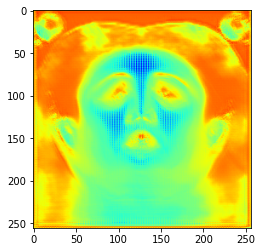

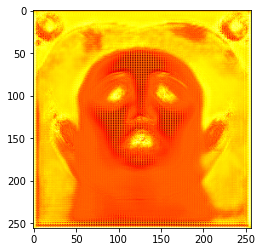

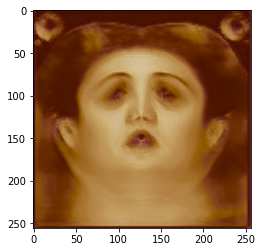

Epoch 1 time elapsed 8.86 sec validation loss 138.06638956069946 loss breakdown [137.96267700195312, 0.10372138023376465]
Epoch 2 time elapsed 91.21 sec training loss 384.48581898212433 loss breakdown [383.8780212402344, 0.607697069644928]
Epoch 3 time elapsed 91.17 sec training loss 189.43027901649475 loss breakdown [188.015380859375, 1.4148991107940674]
Epoch 4 time elapsed 91.12 sec training loss 126.27418503165245 loss breakdown [124.74292755126953, 1.5312846899032593]
Epoch 5 time elapsed 91.16 sec training loss 85.62585857510567 loss breakdown [84.21096801757812, 1.4149105548858643]
saved checkpoint at epoch 5
Epoch 6 time elapsed 91.43 sec training loss 71.3094579577446 loss breakdown [70.11308288574219, 1.1963943243026733]
fmel tensor(0.9717, device='cuda:0') tensor(-0.9944, device='cuda:0') tensor(0.2619, device='cuda:0')
fblood tensor(0.9857, device='cuda:0') tensor(-0.6862, device='cuda:0') tensor(0.2332, device='cuda:0')
sRGB_albedo tensor(0.8337, device='cuda:0') tensor(0.

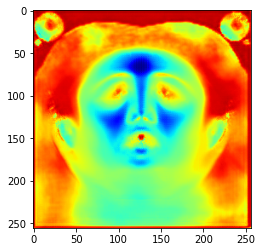

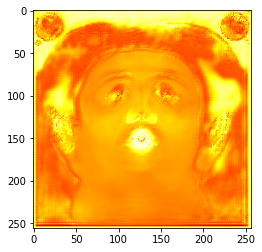

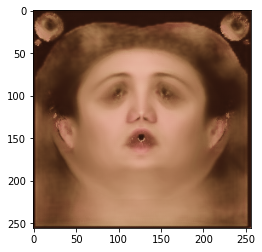

Epoch 6 time elapsed 8.88 sec validation loss 16.412565857172012 loss breakdown [16.133644104003906, 0.2789221405982971]
Epoch 7 time elapsed 91.20 sec training loss 55.944952219724655 loss breakdown [54.702762603759766, 1.2422034740447998]
Epoch 8 time elapsed 91.18 sec training loss 47.98672012984753 loss breakdown [46.64643859863281, 1.3402800559997559]
Epoch 9 time elapsed 91.19 sec training loss 41.06598624587059 loss breakdown [39.64637756347656, 1.4196105003356934]
Epoch 10 time elapsed 91.23 sec training loss 43.67591014504433 loss breakdown [42.206382751464844, 1.46953547000885]
saved checkpoint at epoch 10
Epoch 11 time elapsed 91.44 sec training loss 37.21829153597355 loss breakdown [35.708717346191406, 1.5095794200897217]
fmel tensor(0.9911, device='cuda:0') tensor(-0.9941, device='cuda:0') tensor(0.2626, device='cuda:0')
fblood tensor(0.9924, device='cuda:0') tensor(-0.6568, device='cuda:0') tensor(0.2079, device='cuda:0')
sRGB_albedo tensor(0.8416, device='cuda:0') tensor

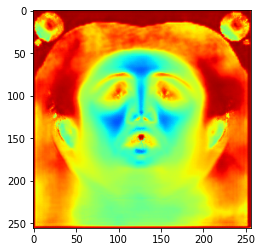

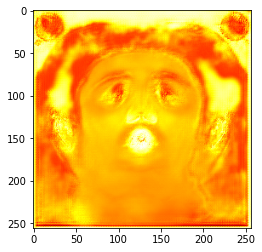

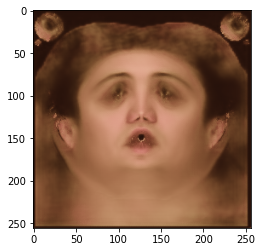

Epoch 11 time elapsed 8.81 sec validation loss 8.429060086607933 loss breakdown [8.07201862335205, 0.357040673494339]
Epoch 12 time elapsed 91.19 sec training loss 35.771468326449394 loss breakdown [34.224361419677734, 1.5471158027648926]
Epoch 13 time elapsed 91.18 sec training loss 37.97434513270855 loss breakdown [36.396888732910156, 1.5774561166763306]
Epoch 14 time elapsed 91.19 sec training loss 32.90342205762863 loss breakdown [31.298343658447266, 1.605078101158142]
Epoch 15 time elapsed 91.24 sec training loss 32.409190863370895 loss breakdown [30.78463363647461, 1.624545931816101]
saved checkpoint at epoch 15
Epoch 16 time elapsed 91.46 sec training loss 33.21218383312225 loss breakdown [31.573904037475586, 1.638277530670166]
fmel tensor(0.9960, device='cuda:0') tensor(-0.9958, device='cuda:0') tensor(0.2623, device='cuda:0')
fblood tensor(0.9963, device='cuda:0') tensor(-0.7394, device='cuda:0') tensor(0.2026, device='cuda:0')
sRGB_albedo tensor(0.8374, device='cuda:0') tenso

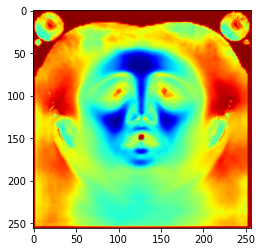

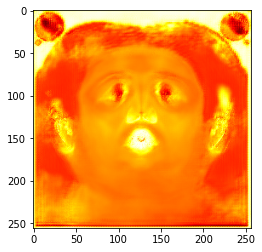

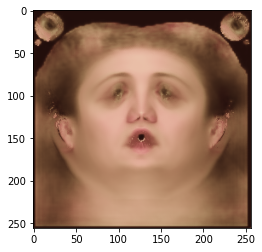

Epoch 16 time elapsed 8.77 sec validation loss 7.456914223730564 loss breakdown [7.057403087615967, 0.39951106905937195]
Epoch 17 time elapsed 91.18 sec training loss 31.837668545544147 loss breakdown [30.182056427001953, 1.655608892440796]
Epoch 18 time elapsed 91.17 sec training loss 30.07625486701727 loss breakdown [28.408414840698242, 1.6678389310836792]
Epoch 19 time elapsed 91.18 sec training loss 33.518014311790466 loss breakdown [31.845003128051758, 1.673011064529419]
Epoch 20 time elapsed 91.23 sec training loss 29.495222836732864 loss breakdown [27.82085609436035, 1.6743649244308472]
saved checkpoint at epoch 20
Epoch 21 time elapsed 91.47 sec training loss 29.0057667568326 loss breakdown [27.309505462646484, 1.6962645053863525]
fmel tensor(0.9970, device='cuda:0') tensor(-0.9971, device='cuda:0') tensor(0.2604, device='cuda:0')
fblood tensor(0.9950, device='cuda:0') tensor(-0.8810, device='cuda:0') tensor(0.1812, device='cuda:0')
sRGB_albedo tensor(0.8433, device='cuda:0') t

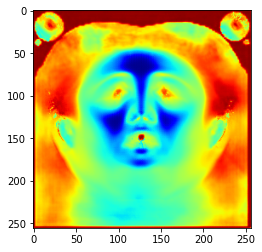

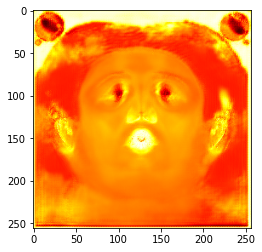

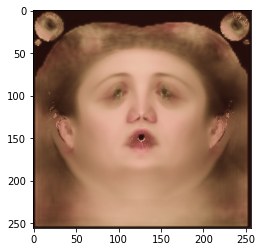

Epoch 21 time elapsed 8.78 sec validation loss 6.753545381128788 loss breakdown [6.341550827026367, 0.4119948148727417]
Epoch 22 time elapsed 91.28 sec training loss 26.750278510153294 loss breakdown [25.050302505493164, 1.6999729871749878]
Epoch 23 time elapsed 91.35 sec training loss 31.02547436952591 loss breakdown [29.315866470336914, 1.709599494934082]
Epoch 24 time elapsed 91.17 sec training loss 28.642141953110695 loss breakdown [26.936159133911133, 1.7059828042984009]
Epoch 25 time elapsed 91.20 sec training loss 27.708400055766106 loss breakdown [25.987781524658203, 1.7206214666366577]
saved checkpoint at epoch 25
Epoch 26 time elapsed 91.50 sec training loss 25.6586701720953 loss breakdown [23.931995391845703, 1.726676106452942]
fmel tensor(0.9976, device='cuda:0') tensor(-0.9952, device='cuda:0') tensor(0.2882, device='cuda:0')
fblood tensor(0.9978, device='cuda:0') tensor(-0.9014, device='cuda:0') tensor(0.2212, device='cuda:0')
sRGB_albedo tensor(0.8269, device='cuda:0') t

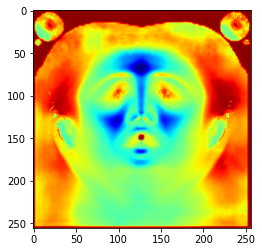

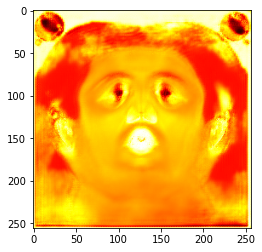

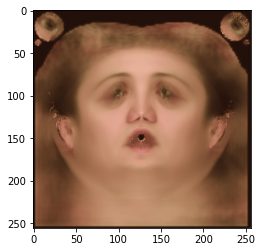

Epoch 26 time elapsed 8.76 sec validation loss 5.896157048642635 loss breakdown [5.471545696258545, 0.4246116876602173]
Epoch 27 time elapsed 91.20 sec training loss 29.128107622265816 loss breakdown [27.397308349609375, 1.7308025360107422]
Epoch 28 time elapsed 91.19 sec training loss 25.81902951002121 loss breakdown [24.0838680267334, 1.7351605892181396]
Epoch 29 time elapsed 91.22 sec training loss 27.00982589274645 loss breakdown [25.26484489440918, 1.7449815273284912]
Epoch 30 time elapsed 91.21 sec training loss 24.563781186938286 loss breakdown [22.822385787963867, 1.7413970232009888]
saved checkpoint at epoch 30
Epoch 31 time elapsed 91.41 sec training loss 24.240397319197655 loss breakdown [22.490306854248047, 1.7500848770141602]
fmel tensor(0.9986, device='cuda:0') tensor(-0.9983, device='cuda:0') tensor(0.2965, device='cuda:0')
fblood tensor(0.9982, device='cuda:0') tensor(-0.9256, device='cuda:0') tensor(0.2072, device='cuda:0')
sRGB_albedo tensor(0.8278, device='cuda:0') t

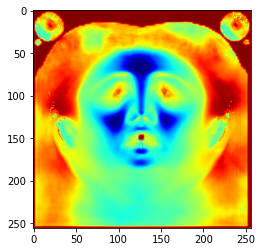

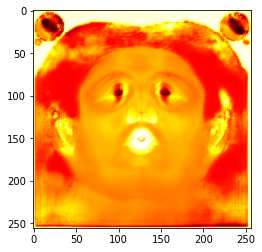

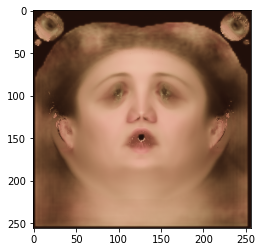

Epoch 31 time elapsed 8.81 sec validation loss 5.903478920459747 loss breakdown [5.475679874420166, 0.4277985692024231]
Epoch 32 time elapsed 91.23 sec training loss 25.406237348914146 loss breakdown [23.647554397583008, 1.758684515953064]
Epoch 33 time elapsed 91.21 sec training loss 26.99780262261629 loss breakdown [25.238365173339844, 1.7594342231750488]
Epoch 34 time elapsed 91.23 sec training loss 25.802620634436607 loss breakdown [24.043500900268555, 1.759125828742981]
Epoch 35 time elapsed 91.24 sec training loss 23.908940628170967 loss breakdown [22.135982513427734, 1.7729617357254028]
saved checkpoint at epoch 35
Epoch 36 time elapsed 91.64 sec training loss 25.050936706364155 loss breakdown [23.27178382873535, 1.7791460752487183]
fmel tensor(0.9991, device='cuda:0') tensor(-0.9955, device='cuda:0') tensor(0.2975, device='cuda:0')
fblood tensor(0.9980, device='cuda:0') tensor(-0.9507, device='cuda:0') tensor(0.1853, device='cuda:0')
sRGB_albedo tensor(0.8263, device='cuda:0') 

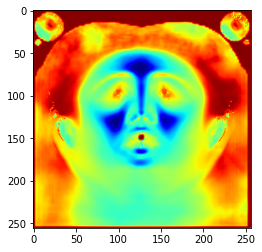

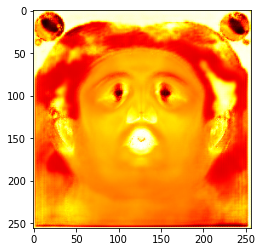

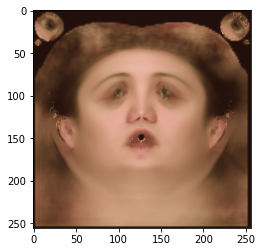

Epoch 36 time elapsed 8.79 sec validation loss 6.485314235091209 loss breakdown [6.05331563949585, 0.43199852108955383]
Epoch 37 time elapsed 91.23 sec training loss 25.338808178901672 loss breakdown [23.56112289428711, 1.777693510055542]
Epoch 38 time elapsed 91.23 sec training loss 26.76652318239212 loss breakdown [24.989788055419922, 1.7767298221588135]
Epoch 39 time elapsed 91.23 sec training loss 27.072936601936817 loss breakdown [25.3134708404541, 1.7594660520553589]
Epoch 40 time elapsed 91.33 sec training loss 25.858644135296345 loss breakdown [24.100343704223633, 1.7583062648773193]
saved checkpoint at epoch 40
Epoch 41 time elapsed 91.49 sec training loss 22.76169838756323 loss breakdown [20.995771408081055, 1.7659265995025635]
fmel tensor(0.9993, device='cuda:0') tensor(-0.9974, device='cuda:0') tensor(0.2728, device='cuda:0')
fblood tensor(0.9992, device='cuda:0') tensor(-0.9647, device='cuda:0') tensor(0.1783, device='cuda:0')
sRGB_albedo tensor(0.8565, device='cuda:0') te

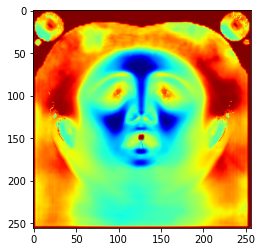

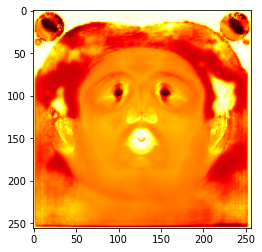

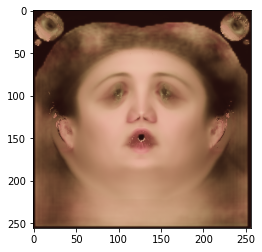

Epoch 41 time elapsed 8.78 sec validation loss 5.315690286457539 loss breakdown [4.878791809082031, 0.436898797750473]
Epoch 42 time elapsed 91.46 sec training loss 24.078470803797245 loss breakdown [22.332565307617188, 1.7459089756011963]
Epoch 43 time elapsed 91.25 sec training loss 25.22467128187418 loss breakdown [23.462800979614258, 1.7618666887283325]
Epoch 44 time elapsed 91.25 sec training loss 22.561982475221157 loss breakdown [20.80522918701172, 1.756749153137207]
Epoch 45 time elapsed 91.22 sec training loss 23.80714726448059 loss breakdown [22.053627014160156, 1.7535171508789062]
saved checkpoint at epoch 45
Epoch 46 time elapsed 91.58 sec training loss 23.554490104317665 loss breakdown [21.802730560302734, 1.7517549991607666]
fmel tensor(0.9996, device='cuda:0') tensor(-0.9971, device='cuda:0') tensor(0.2650, device='cuda:0')
fblood tensor(0.9992, device='cuda:0') tensor(-0.9669, device='cuda:0') tensor(0.1381, device='cuda:0')
sRGB_albedo tensor(0.8635, device='cuda:0') t

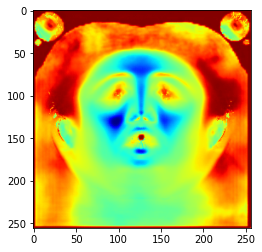

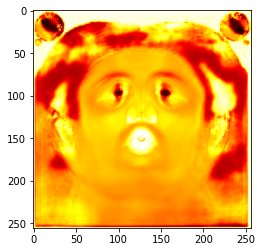

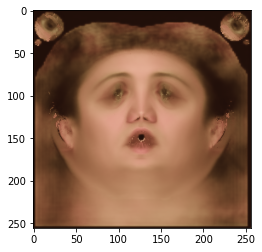

Epoch 46 time elapsed 8.89 sec validation loss 5.241349011659622 loss breakdown [4.820272445678711, 0.4210764169692993]
Epoch 47 time elapsed 91.28 sec training loss 23.52763032913208 loss breakdown [21.770410537719727, 1.7572252750396729]
Epoch 48 time elapsed 91.21 sec training loss 31.976303331553936 loss breakdown [30.190935134887695, 1.785366177558899]
Epoch 49 time elapsed 91.25 sec training loss 24.366372771561146 loss breakdown [22.557846069335938, 1.8085227012634277]
Epoch 50 time elapsed 91.21 sec training loss 24.204251006245613 loss breakdown [22.386367797851562, 1.8178813457489014]
saved checkpoint at epoch 50
Epoch 51 time elapsed 91.49 sec training loss 23.801848240196705 loss breakdown [22.018205642700195, 1.7836508750915527]
fmel tensor(0.9997, device='cuda:0') tensor(-0.9959, device='cuda:0') tensor(0.2701, device='cuda:0')
fblood tensor(0.9975, device='cuda:0') tensor(-0.9711, device='cuda:0') tensor(0.1219, device='cuda:0')
sRGB_albedo tensor(0.8592, device='cuda:0'

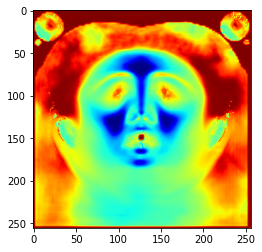

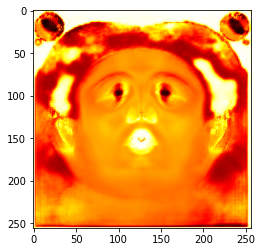

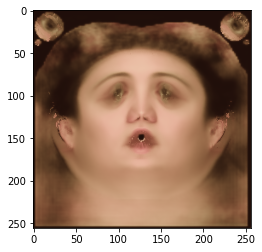

Epoch 51 time elapsed 8.77 sec validation loss 6.070854760706425 loss breakdown [5.651122093200684, 0.41973286867141724]
Epoch 52 time elapsed 91.24 sec training loss 23.18439980596304 loss breakdown [21.435382843017578, 1.7490142583847046]
Epoch 53 time elapsed 91.27 sec training loss 21.349187284708023 loss breakdown [19.58286476135254, 1.7663288116455078]
Epoch 54 time elapsed 91.27 sec training loss 22.12105243653059 loss breakdown [20.353443145751953, 1.7676132917404175]
Epoch 55 time elapsed 91.26 sec training loss 25.856894955039024 loss breakdown [24.085525512695312, 1.771370530128479]
saved checkpoint at epoch 55
Epoch 56 time elapsed 91.53 sec training loss 22.65100947022438 loss breakdown [20.875444412231445, 1.775560736656189]
fmel tensor(0.9997, device='cuda:0') tensor(-0.9992, device='cuda:0') tensor(0.3159, device='cuda:0')
fblood tensor(0.9994, device='cuda:0') tensor(-0.9779, device='cuda:0') tensor(0.2131, device='cuda:0')
sRGB_albedo tensor(0.8324, device='cuda:0') t

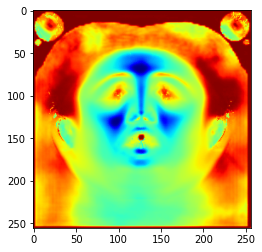

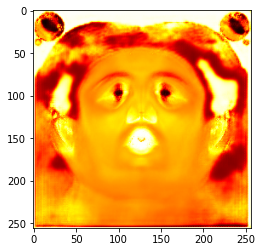

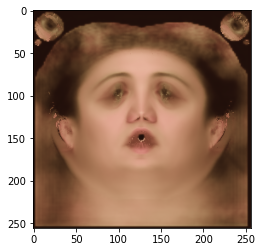

Epoch 56 time elapsed 8.81 sec validation loss 5.090658210217953 loss breakdown [4.656735897064209, 0.43392214179039]
Epoch 57 time elapsed 91.29 sec training loss 22.293182894587517 loss breakdown [20.510074615478516, 1.783111810684204]
Epoch 58 time elapsed 91.26 sec training loss 21.237202912569046 loss breakdown [19.465051651000977, 1.7721595764160156]
Epoch 59 time elapsed 91.26 sec training loss 26.616968385875225 loss breakdown [24.831165313720703, 1.7857928276062012]
Epoch 60 time elapsed 91.35 sec training loss 22.940945737063885 loss breakdown [21.15078353881836, 1.7901586294174194]
saved checkpoint at epoch 60
Epoch 61 time elapsed 91.58 sec training loss 21.422507166862488 loss breakdown [19.629941940307617, 1.79256272315979]
fmel tensor(0.9997, device='cuda:0') tensor(-0.9966, device='cuda:0') tensor(0.2458, device='cuda:0')
fblood tensor(0.9994, device='cuda:0') tensor(-0.9834, device='cuda:0') tensor(0.1079, device='cuda:0')
sRGB_albedo tensor(0.8647, device='cuda:0') te

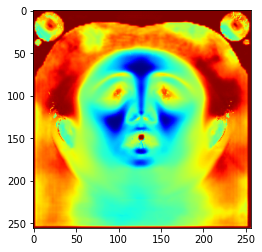

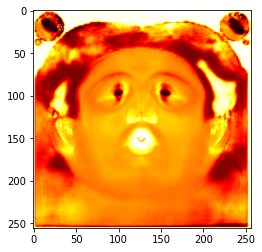

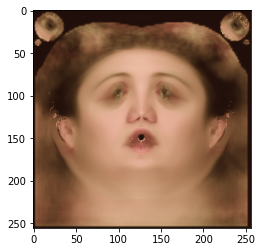

Epoch 61 time elapsed 8.81 sec validation loss 7.893391005694866 loss breakdown [7.442025184631348, 0.4513671398162842]
Epoch 62 time elapsed 91.29 sec training loss 21.209812805056572 loss breakdown [19.42113494873047, 1.788673996925354]
Epoch 63 time elapsed 91.34 sec training loss 21.15201846510172 loss breakdown [19.36607551574707, 1.7859485149383545]
Epoch 64 time elapsed 91.30 sec training loss 21.927988283336163 loss breakdown [20.106962203979492, 1.8210233449935913]
Epoch 65 time elapsed 91.42 sec training loss 23.390107825398445 loss breakdown [21.59676170349121, 1.7933450937271118]
saved checkpoint at epoch 65
Epoch 66 time elapsed 91.64 sec training loss 20.68566181510687 loss breakdown [18.899166107177734, 1.7864985466003418]
fmel tensor(0.9998, device='cuda:0') tensor(-0.9960, device='cuda:0') tensor(0.2540, device='cuda:0')
fblood tensor(0.9997, device='cuda:0') tensor(-0.9842, device='cuda:0') tensor(0.0774, device='cuda:0')
sRGB_albedo tensor(0.8680, device='cuda:0') te

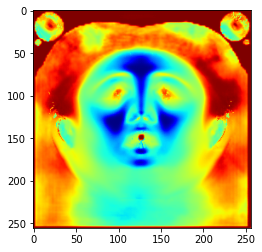

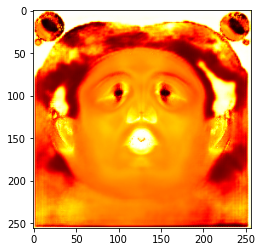

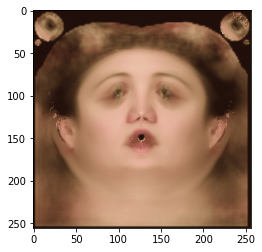

Epoch 66 time elapsed 8.82 sec validation loss 5.588641822338104 loss breakdown [5.133199214935303, 0.4554413855075836]
Epoch 67 time elapsed 91.36 sec training loss 20.235587306320667 loss breakdown [18.442598342895508, 1.7929880619049072]
Epoch 68 time elapsed 91.39 sec training loss 21.88005641847849 loss breakdown [20.08064079284668, 1.7994112968444824]
Epoch 69 time elapsed 91.41 sec training loss 20.25023292005062 loss breakdown [18.447589874267578, 1.8026487827301025]
Epoch 70 time elapsed 91.42 sec training loss 20.624053217470646 loss breakdown [18.8176212310791, 1.80643630027771]
saved checkpoint at epoch 70
Epoch 71 time elapsed 91.65 sec training loss 20.005971260368824 loss breakdown [18.201608657836914, 1.8043636083602905]
fmel tensor(0.9998, device='cuda:0') tensor(-0.9982, device='cuda:0') tensor(0.2671, device='cuda:0')
fblood tensor(0.9998, device='cuda:0') tensor(-0.9881, device='cuda:0') tensor(0.1141, device='cuda:0')
sRGB_albedo tensor(0.8630, device='cuda:0') ten

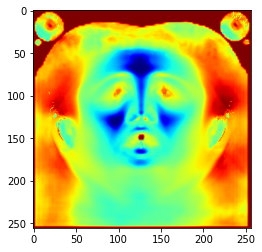

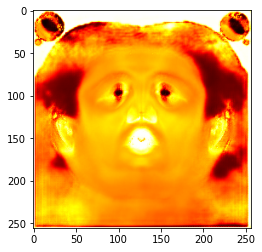

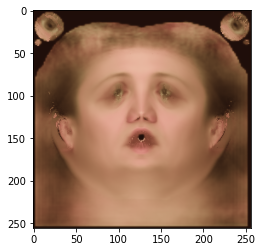

Epoch 71 time elapsed 8.94 sec validation loss 6.039649277925491 loss breakdown [5.585451126098633, 0.4541977047920227]
Epoch 72 time elapsed 91.43 sec training loss 19.77576982229948 loss breakdown [17.965938568115234, 1.809831142425537]
Epoch 73 time elapsed 91.41 sec training loss 20.55111964792013 loss breakdown [18.740768432617188, 1.810355305671692]
Epoch 74 time elapsed 91.38 sec training loss 20.599665634334087 loss breakdown [18.78254508972168, 1.8171207904815674]
Epoch 75 time elapsed 91.29 sec training loss 23.482824809849262 loss breakdown [21.672243118286133, 1.8105874061584473]


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/torch/serialization.py", line 379, in save
    _save(obj, opened_zipfile, pickle_module, pickle_protocol)
  File "/usr/local/lib/python3.7/dist-packages/torch/serialization.py", line 499, in _save
    zip_file.write_record(name, storage.data_ptr(), num_bytes)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py", line 2882, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-15-e4ccb3238b64>", line 44, in <module>
    }, cpt_path)
  File "/usr/local/lib/python3.7/dist-packages/torch/serialization.py", line 380, in save
    return
  File "/usr/local/lib/python3.7/dist-packages/torch/serialization.py", line 259, in __exit__
    self.file_like.write_end_of_file()
RuntimeError: [enforce fail at inline_container.cc:298] . unex

TypeError: ignored

In [ ]:
train_losses = []
val_losses = []
lepoch = -1 #last epoch

'''
use this to load checkpoint if training is interrupted and start from last epoch + 1
checkpoint = torch.load(cpt_path)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
lepoch = checkpoint['epoch']
train_losses = checkpoint['train_losses']
val_losses = checkpoint['val_losses']

'''
if params['pretrain_dir']:
  checkpoint = torch.load(params['pretrain_dir'])
  model.load_state_dict(checkpoint['model_state_dict'])
  optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

for epoch in range(1+lepoch, epochs):
  model.train()
  train_loss = 0.0
  split_loss = torch.zeros(2)
  start = time.time()
  for images in train_loader:      
    images=images.to(device)
    optimizer.zero_grad()
    lightingparameters,b,fmel,fblood,predictedShading,specmask = model.predict(images)
    loss, loss_s, sRGB_albedo, _, _ = calc_loss_modified(images,lightingparameters,b,fmel,fblood,predictedShading,specmask,u)        
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    split_loss += loss_s
  train_losses.append(train_loss)
  scheduler.step()
  print("Epoch {} time elapsed {:.2f} sec training loss {} loss breakdown {}".format(epoch+1, time.time()-start, train_loss, split_loss.tolist()))

  if (epoch+1)%5==0:
    torch.save({'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'train_losses': train_losses,
                'val_losses' : val_losses
                }, cpt_path)
    print("saved checkpoint at epoch", epoch+1)
  
  if epoch%5 == 0:
    #validation
    model.eval()
    start = time.time()
    with torch.no_grad():
      val_loss = 0.0
      split_loss = torch.zeros(2)
      for batch_idx, images in enumerate(val_loader):       
        images=images.to(device)
        lightingparameters,b,fmel,fblood,predictedShading,specmask = model.predict(images)

        # Use linspace instead
        # fblood = linspace_blood.expand(fblood.shape[0], -1, -1)
        # fmel = linspace_mel.expand(fmel.shape[0], -1, -1)

        loss, loss_s, sRGB_albedo, fmel, fblood = calc_loss_modified(images,lightingparameters,b,fmel,fblood,predictedShading,specmask,u)
        split_loss += loss_s
        val_loss += loss.item()

        if batch_idx == 0:
          print('fmel', torch.max(fmel), torch.min(fmel), torch.mean(fmel))
          print('fblood', torch.max(fblood), torch.min(fblood), torch.mean(fblood))
          print('sRGB_albedo', torch.max(sRGB_albedo), torch.min(sRGB_albedo), torch.mean(sRGB_albedo))
          plt.imshow(cm.jet(0.5*(1+fmel[0]).detach().cpu().numpy()))
          plt.show()
          plt.imshow(cm.hot(0.5*(1+fblood[0]).detach().cpu().numpy()))
          plt.show()
          plt.imshow(torch.clamp(((sRGB_albedo[0].detach())**(1/2.2)).cpu().permute(1, 2, 0), 0, 1).numpy())
          # plt.imshow((sRGB_albedo[0].detach()).cpu().permute(1, 2, 0).numpy())
          plt.show()
      val_losses.append(val_loss)

    print("Epoch {} time elapsed {:.2f} sec validation loss {} loss breakdown {}".format(epoch+1, time.time()-start, val_loss, split_loss.tolist()))

plt.figure()
plt.plot([i+1 for i in range(len(train_losses))] ,train_losses)
plt.title("training loss")
plt.show()

plt.figure()
plt.plot([5*i+4 for i in range(len(val_losses))] ,val_losses)
plt.title("validation loss")
plt.show()

# tanhtanh

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


Epoch 1 time elapsed 106.27 sec training loss 1382.288447380066 loss breakdown [1380.9576416015625, 1.330938458442688]
fmel tensor(0.9805, device='cuda:0') tensor(-0.7487, device='cuda:0') tensor(0.2024, device='cuda:0')
fblood tensor(0.9994, device='cuda:0') tensor(-0.5367, device='cuda:0') tensor(0.3563, device='cuda:0')
sRGB_albedo tensor(0.8273, device='cuda:0') tensor(0.0005, device='cuda:0') tensor(0.2012, device='cuda:0')


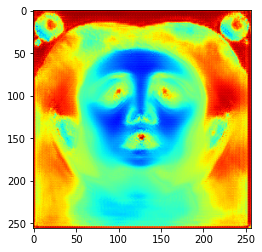

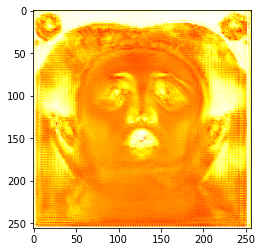

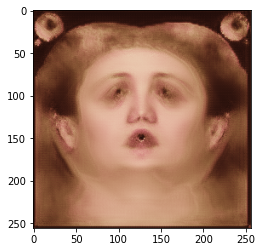

Epoch 1 time elapsed 8.45 sec validation loss 57.23865896463394 loss breakdown [56.920345306396484, 0.3183210790157318]
Epoch 2 time elapsed 105.05 sec training loss 237.1212039589882 loss breakdown [235.43975830078125, 1.6814026832580566]
Epoch 3 time elapsed 105.50 sec training loss 140.32762399315834 loss breakdown [138.2758026123047, 2.0518252849578857]
Epoch 4 time elapsed 105.50 sec training loss 104.86085173487663 loss breakdown [102.69457244873047, 2.1662886142730713]
Epoch 5 time elapsed 105.45 sec training loss 88.58015610277653 loss breakdown [86.32950592041016, 2.250642776489258]
saved checkpoint at epoch 5
Epoch 6 time elapsed 106.07 sec training loss 97.48778253793716 loss breakdown [95.1688003540039, 2.3189632892608643]
fmel tensor(0.9996, device='cuda:0') tensor(-0.9219, device='cuda:0') tensor(0.2914, device='cuda:0')
fblood tensor(1.0000, device='cuda:0') tensor(-0.7729, device='cuda:0') tensor(0.2502, device='cuda:0')
sRGB_albedo tensor(0.8322, device='cuda:0') tenso

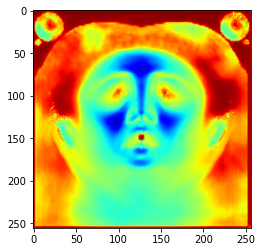

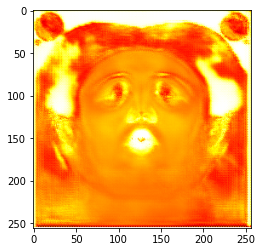

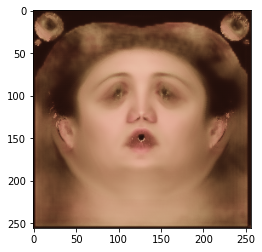

Epoch 6 time elapsed 8.45 sec validation loss 13.559266209602356 loss breakdown [13.036404609680176, 0.5228631496429443]
Epoch 7 time elapsed 105.33 sec training loss 72.12589384615421 loss breakdown [69.79579162597656, 2.3300821781158447]
Epoch 8 time elapsed 105.15 sec training loss 62.290401577949524 loss breakdown [59.89796447753906, 2.3924224376678467]
Epoch 9 time elapsed 105.03 sec training loss 60.17913557589054 loss breakdown [57.745506286621094, 2.4336376190185547]
Epoch 10 time elapsed 105.20 sec training loss 54.695448249578476 loss breakdown [52.24238204956055, 2.453061580657959]
saved checkpoint at epoch 10
Epoch 11 time elapsed 105.90 sec training loss 75.99751329421997 loss breakdown [73.5611343383789, 2.436398506164551]
fmel tensor(0.9999, device='cuda:0') tensor(-0.9622, device='cuda:0') tensor(0.2652, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.8774, device='cuda:0') tensor(0.1905, device='cuda:0')
sRGB_albedo tensor(0.8576, device='cuda:0') tensor(

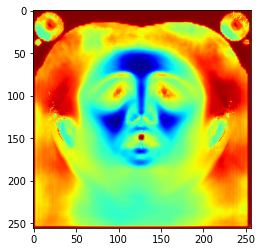

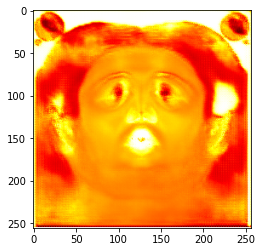

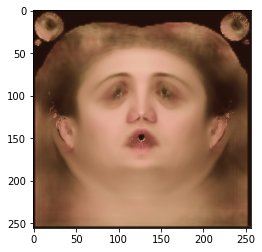

Epoch 11 time elapsed 8.24 sec validation loss 11.295010946691036 loss breakdown [10.735630989074707, 0.5593803524971008]
Epoch 12 time elapsed 105.52 sec training loss 53.30956707894802 loss breakdown [50.836585998535156, 2.4730169773101807]
Epoch 13 time elapsed 105.78 sec training loss 50.78994410485029 loss breakdown [48.3023796081543, 2.4875640869140625]
Epoch 14 time elapsed 105.35 sec training loss 50.34736783057451 loss breakdown [47.84284973144531, 2.504516839981079]
Epoch 15 time elapsed 105.18 sec training loss 48.64706612378359 loss breakdown [46.148468017578125, 2.4986050128936768]
saved checkpoint at epoch 15
Epoch 16 time elapsed 105.71 sec training loss 52.59001212567091 loss breakdown [50.075565338134766, 2.5144593715667725]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9795, device='cuda:0') tensor(0.2947, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9255, device='cuda:0') tensor(0.2026, device='cuda:0')
sRGB_albedo tensor(0.8511, device='cuda:0') te

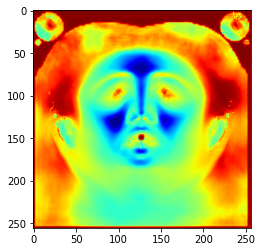

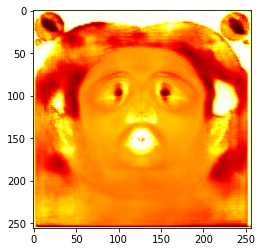

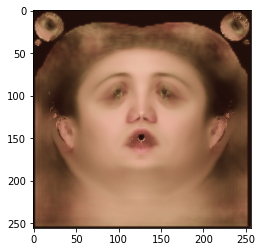

Epoch 16 time elapsed 8.19 sec validation loss 10.320848859846592 loss breakdown [9.742053031921387, 0.5787973403930664]
Epoch 17 time elapsed 105.30 sec training loss 52.05082296580076 loss breakdown [49.548858642578125, 2.5019583702087402]
Epoch 18 time elapsed 105.20 sec training loss 46.14211102575064 loss breakdown [43.63071060180664, 2.511394739151001]
Epoch 19 time elapsed 105.29 sec training loss 51.023743249475956 loss breakdown [48.50182342529297, 2.5219156742095947]
Epoch 20 time elapsed 105.35 sec training loss 49.11358270794153 loss breakdown [46.58655548095703, 2.527034282684326]
saved checkpoint at epoch 20
Epoch 21 time elapsed 106.01 sec training loss 41.470866307616234 loss breakdown [38.92910385131836, 2.541769027709961]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9926, device='cuda:0') tensor(0.2441, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9601, device='cuda:0') tensor(0.1258, device='cuda:0')
sRGB_albedo tensor(0.8586, device='cuda:0') tens

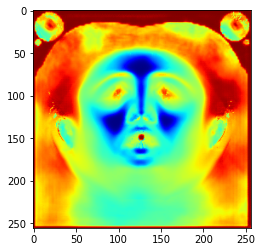

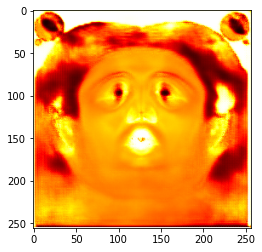

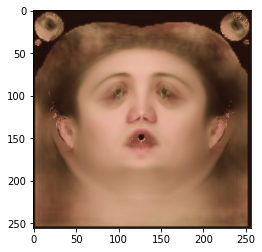

Epoch 21 time elapsed 8.20 sec validation loss 8.852071389555931 loss breakdown [8.238688468933105, 0.6133819222450256]
Epoch 22 time elapsed 105.27 sec training loss 44.61879427731037 loss breakdown [42.064186096191406, 2.554611921310425]
Epoch 23 time elapsed 105.15 sec training loss 50.7964995726943 loss breakdown [48.246700286865234, 2.5498204231262207]
Epoch 24 time elapsed 105.24 sec training loss 45.94638408720493 loss breakdown [43.41017532348633, 2.536228656768799]
Epoch 25 time elapsed 105.19 sec training loss 43.5695014372468 loss breakdown [41.01778793334961, 2.551706075668335]
saved checkpoint at epoch 25
Epoch 26 time elapsed 105.99 sec training loss 39.57081115245819 loss breakdown [36.99909210205078, 2.5717172622680664]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9867, device='cuda:0') tensor(0.3038, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9773, device='cuda:0') tensor(0.1610, device='cuda:0')
sRGB_albedo tensor(0.8489, device='cuda:0') tensor(0

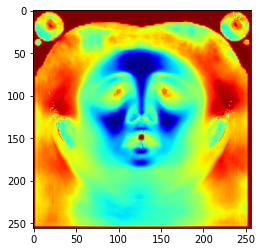

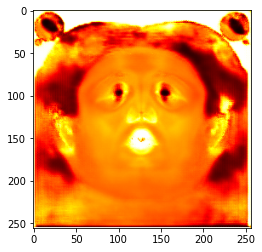

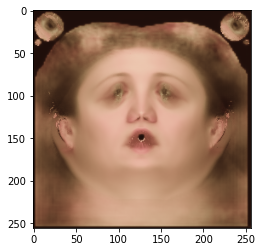

Epoch 26 time elapsed 8.20 sec validation loss 7.353005759418011 loss breakdown [6.736089706420898, 0.6169160604476929]
Epoch 27 time elapsed 104.87 sec training loss 48.25774158537388 loss breakdown [45.67532730102539, 2.5824108123779297]
Epoch 28 time elapsed 105.27 sec training loss 39.61340643465519 loss breakdown [37.02961349487305, 2.5838027000427246]
Epoch 29 time elapsed 105.19 sec training loss 48.008479818701744 loss breakdown [45.418460845947266, 2.590022563934326]
Epoch 30 time elapsed 105.25 sec training loss 39.672819189727306 loss breakdown [37.06769943237305, 2.6051383018493652]
saved checkpoint at epoch 30
Epoch 31 time elapsed 106.13 sec training loss 41.01025576144457 loss breakdown [38.407470703125, 2.6027824878692627]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9929, device='cuda:0') tensor(0.2776, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9816, device='cuda:0') tensor(0.1301, device='cuda:0')
sRGB_albedo tensor(0.8564, device='cuda:0') tenso

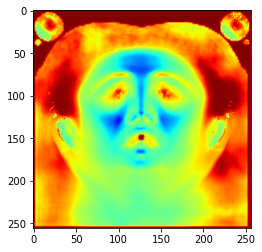

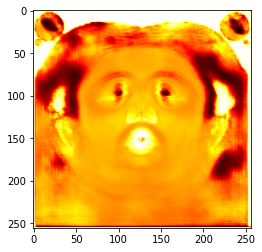

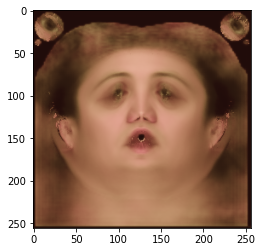

Epoch 31 time elapsed 8.34 sec validation loss 7.299274452030659 loss breakdown [6.694260597229004, 0.6050142049789429]
Epoch 32 time elapsed 105.32 sec training loss 38.57874893397093 loss breakdown [35.97200012207031, 2.6067354679107666]
Epoch 33 time elapsed 105.25 sec training loss 39.41533125191927 loss breakdown [36.7977180480957, 2.6176209449768066]
Epoch 34 time elapsed 105.24 sec training loss 46.07535199075937 loss breakdown [43.450538635253906, 2.624814748764038]
Epoch 35 time elapsed 105.29 sec training loss 45.788818545639515 loss breakdown [43.1824836730957, 2.606334686279297]
saved checkpoint at epoch 35
Epoch 36 time elapsed 106.14 sec training loss 37.08656952530146 loss breakdown [34.46492385864258, 2.6216394901275635]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9952, device='cuda:0') tensor(0.2512, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9877, device='cuda:0') tensor(0.1032, device='cuda:0')
sRGB_albedo tensor(0.8700, device='cuda:0') tensor(

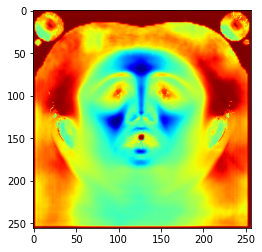

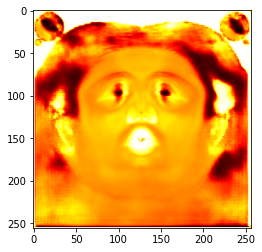

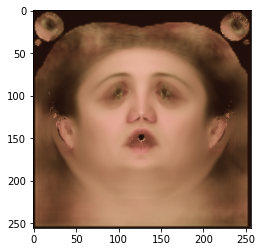

Epoch 36 time elapsed 8.19 sec validation loss 7.121514946222305 loss breakdown [6.502531051635742, 0.6189852356910706]
Epoch 37 time elapsed 105.43 sec training loss 37.655960604548454 loss breakdown [35.016326904296875, 2.6396398544311523]
Epoch 38 time elapsed 105.39 sec training loss 36.639500096440315 loss breakdown [33.98954391479492, 2.6499478816986084]
Epoch 39 time elapsed 105.28 sec training loss 43.222398936748505 loss breakdown [40.572654724121094, 2.6497459411621094]
Epoch 40 time elapsed 105.21 sec training loss 35.327093318104744 loss breakdown [32.69318771362305, 2.633909225463867]
saved checkpoint at epoch 40
Epoch 41 time elapsed 106.17 sec training loss 36.51206650584936 loss breakdown [33.85517501831055, 2.656895160675049]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9971, device='cuda:0') tensor(0.2714, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9913, device='cuda:0') tensor(0.1321, device='cuda:0')
sRGB_albedo tensor(0.8475, device='cuda:0') t

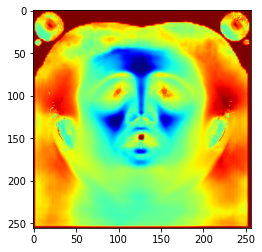

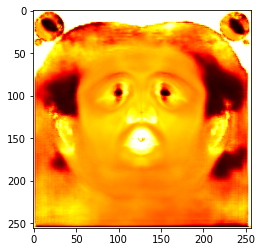

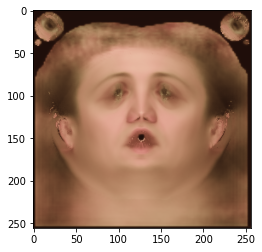

Epoch 41 time elapsed 8.24 sec validation loss 7.255856782197952 loss breakdown [6.629263877868652, 0.6265926361083984]
Epoch 42 time elapsed 105.38 sec training loss 45.505272291600704 loss breakdown [42.856510162353516, 2.648766279220581]
Epoch 43 time elapsed 105.35 sec training loss 38.2688954770565 loss breakdown [35.644107818603516, 2.624786138534546]
Epoch 44 time elapsed 105.26 sec training loss 38.6520077586174 loss breakdown [36.01435852050781, 2.6376593112945557]
Epoch 45 time elapsed 105.21 sec training loss 41.507849879562855 loss breakdown [38.86237716674805, 2.645488739013672]
saved checkpoint at epoch 45
Epoch 46 time elapsed 106.32 sec training loss 34.97206252813339 loss breakdown [32.31298065185547, 2.6590824127197266]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9974, device='cuda:0') tensor(0.2838, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9947, device='cuda:0') tensor(0.1425, device='cuda:0')
sRGB_albedo tensor(0.8619, device='cuda:0') tensor

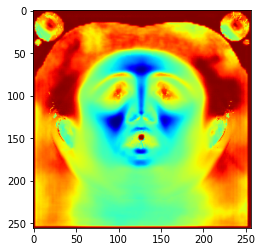

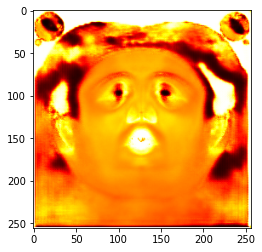

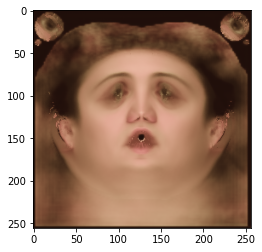

Epoch 46 time elapsed 8.21 sec validation loss 6.7325582429766655 loss breakdown [6.098211288452148, 0.6343467235565186]
Epoch 47 time elapsed 105.28 sec training loss 34.10765628516674 loss breakdown [31.427762985229492, 2.679896354675293]
Epoch 48 time elapsed 105.25 sec training loss 36.291478246450424 loss breakdown [33.61819076538086, 2.673278570175171]
Epoch 49 time elapsed 105.18 sec training loss 34.71606054902077 loss breakdown [32.03758239746094, 2.6784684658050537]
Epoch 50 time elapsed 105.39 sec training loss 36.23448384553194 loss breakdown [33.549720764160156, 2.6847457885742188]
saved checkpoint at epoch 50
Epoch 51 time elapsed 106.20 sec training loss 37.43895796686411 loss breakdown [34.76008224487305, 2.6788880825042725]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9991, device='cuda:0') tensor(0.2497, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9946, device='cuda:0') tensor(0.0737, device='cuda:0')
sRGB_albedo tensor(0.8696, device='cuda:0') ten

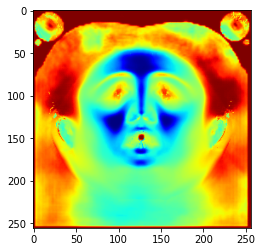

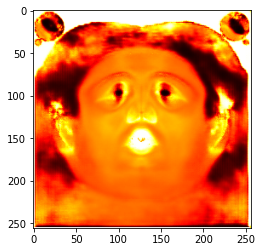

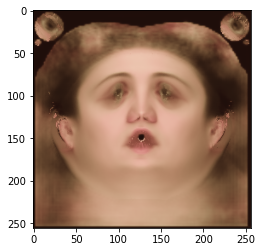

Epoch 51 time elapsed 8.27 sec validation loss 6.827652812004089 loss breakdown [6.2020673751831055, 0.6255853772163391]
Epoch 52 time elapsed 104.95 sec training loss 35.33532086759806 loss breakdown [32.64659118652344, 2.6887457370758057]
Epoch 53 time elapsed 105.36 sec training loss 35.331043377518654 loss breakdown [32.638275146484375, 2.692763090133667]
Epoch 54 time elapsed 105.33 sec training loss 38.21710692346096 loss breakdown [35.523983001708984, 2.693122625350952]
Epoch 55 time elapsed 105.44 sec training loss 37.57895205169916 loss breakdown [34.89387130737305, 2.685089349746704]
saved checkpoint at epoch 55
Epoch 56 time elapsed 105.84 sec training loss 34.83666813373566 loss breakdown [32.14473342895508, 2.6919355392456055]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9968, device='cuda:0') tensor(0.2811, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9955, device='cuda:0') tensor(0.1043, device='cuda:0')
sRGB_albedo tensor(0.8650, device='cuda:0') tens

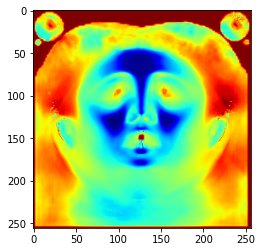

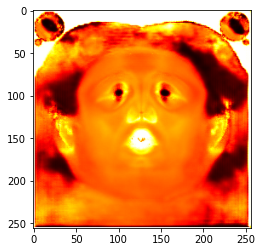

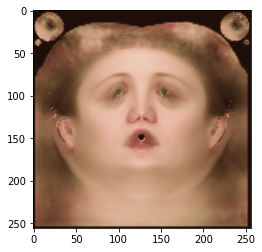

Epoch 56 time elapsed 8.24 sec validation loss 7.182702049612999 loss breakdown [6.5451226234436035, 0.6375793218612671]
Epoch 57 time elapsed 105.56 sec training loss 33.83259905129671 loss breakdown [31.136272430419922, 2.6963260173797607]
Epoch 58 time elapsed 105.52 sec training loss 34.54238602519035 loss breakdown [31.834714889526367, 2.7076807022094727]
Epoch 59 time elapsed 105.59 sec training loss 35.20211497694254 loss breakdown [32.5012321472168, 2.7008848190307617]
Epoch 60 time elapsed 105.59 sec training loss 39.29500591009855 loss breakdown [36.6005744934082, 2.6944477558135986]
saved checkpoint at epoch 60
Epoch 61 time elapsed 106.14 sec training loss 36.02854637056589 loss breakdown [33.33983612060547, 2.6887171268463135]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9915, device='cuda:0') tensor(0.2652, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9969, device='cuda:0') tensor(0.1234, device='cuda:0')
sRGB_albedo tensor(0.8716, device='cuda:0') tens

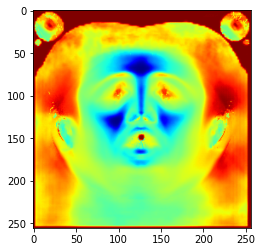

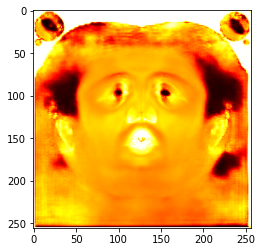

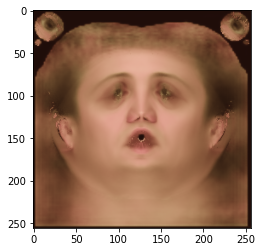

Epoch 61 time elapsed 8.31 sec validation loss 8.088720262050629 loss breakdown [7.4488749504089355, 0.6398468613624573]
Epoch 62 time elapsed 105.58 sec training loss 34.9323875233531 loss breakdown [32.22657775878906, 2.7058141231536865]
Epoch 63 time elapsed 105.62 sec training loss 32.40717025101185 loss breakdown [29.705373764038086, 2.7017858028411865]
Epoch 64 time elapsed 105.57 sec training loss 37.00907465815544 loss breakdown [34.31447219848633, 2.69459867477417]
Epoch 65 time elapsed 105.54 sec training loss 33.222768157720566 loss breakdown [30.524093627929688, 2.698680877685547]
saved checkpoint at epoch 65
Epoch 66 time elapsed 106.29 sec training loss 33.48752883076668 loss breakdown [30.777807235717773, 2.709719657897949]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9984, device='cuda:0') tensor(0.2918, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9977, device='cuda:0') tensor(0.1356, device='cuda:0')
sRGB_albedo tensor(0.8604, device='cuda:0') tenso

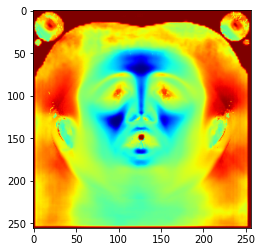

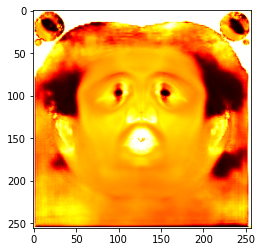

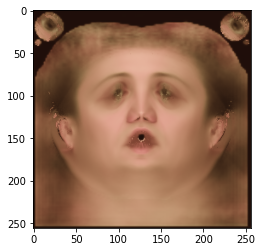

Epoch 66 time elapsed 8.30 sec validation loss 6.46916451305151 loss breakdown [5.823365211486816, 0.6457989811897278]
Epoch 67 time elapsed 105.64 sec training loss 34.52445736527443 loss breakdown [31.81984519958496, 2.704608917236328]
Epoch 68 time elapsed 105.66 sec training loss 32.97949802875519 loss breakdown [30.27536964416504, 2.7041194438934326]
Epoch 69 time elapsed 105.65 sec training loss 33.862724117934704 loss breakdown [31.155841827392578, 2.706883668899536]
Epoch 70 time elapsed 105.63 sec training loss 32.436937272548676 loss breakdown [29.729812622070312, 2.7071330547332764]
saved checkpoint at epoch 70
Epoch 71 time elapsed 106.38 sec training loss 33.17781548202038 loss breakdown [30.469829559326172, 2.707986831665039]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9981, device='cuda:0') tensor(0.2826, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9979, device='cuda:0') tensor(0.1213, device='cuda:0')
sRGB_albedo tensor(0.8676, device='cuda:0') tens

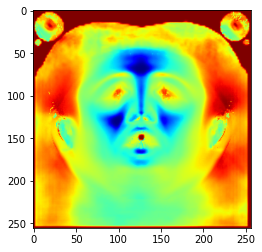

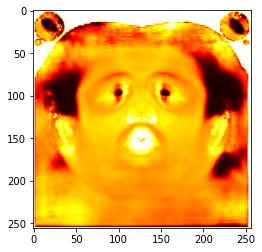

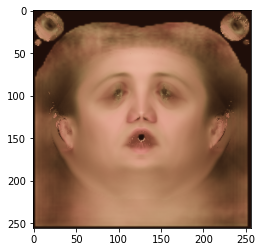

Epoch 71 time elapsed 8.30 sec validation loss 6.959203310310841 loss breakdown [6.317493438720703, 0.6417117118835449]
Epoch 72 time elapsed 105.77 sec training loss 36.15157676488161 loss breakdown [33.4410400390625, 2.710520029067993]
Epoch 73 time elapsed 105.67 sec training loss 35.18185802549124 loss breakdown [32.49038314819336, 2.6914782524108887]
Epoch 74 time elapsed 105.72 sec training loss 32.501763701438904 loss breakdown [29.790977478027344, 2.710792064666748]
Epoch 75 time elapsed 105.73 sec training loss 32.83080879598856 loss breakdown [30.118072509765625, 2.7127366065979004]
saved checkpoint at epoch 75
Epoch 76 time elapsed 106.15 sec training loss 32.77090822905302 loss breakdown [30.05864715576172, 2.7122647762298584]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9967, device='cuda:0') tensor(0.2639, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9984, device='cuda:0') tensor(0.0978, device='cuda:0')
sRGB_albedo tensor(0.8778, device='cuda:0') tenso

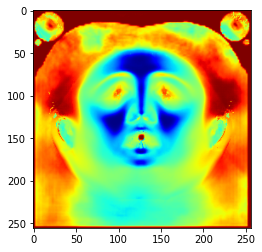

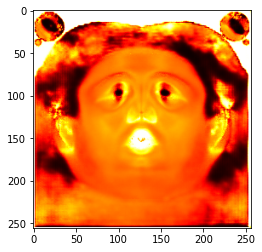

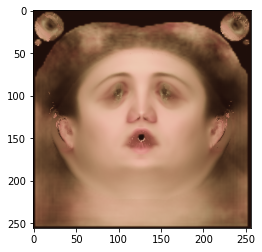

Epoch 76 time elapsed 8.32 sec validation loss 8.895152695477009 loss breakdown [8.259583473205566, 0.6355683207511902]
Epoch 77 time elapsed 105.27 sec training loss 32.910043470561504 loss breakdown [30.197681427001953, 2.7123618125915527]
Epoch 78 time elapsed 105.52 sec training loss 34.251670710742474 loss breakdown [31.533349990844727, 2.7183382511138916]
Epoch 79 time elapsed 105.60 sec training loss 33.22970049828291 loss breakdown [30.530006408691406, 2.6996872425079346]
Epoch 80 time elapsed 105.68 sec training loss 32.40094096958637 loss breakdown [29.69292640686035, 2.708014488220215]
saved checkpoint at epoch 80
Epoch 81 time elapsed 106.29 sec training loss 32.9713022634387 loss breakdown [30.258092880249023, 2.713210105895996]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9988, device='cuda:0') tensor(0.2630, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9984, device='cuda:0') tensor(0.1173, device='cuda:0')
sRGB_albedo tensor(0.8588, device='cuda:0') te

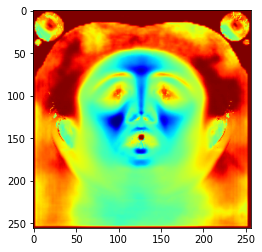

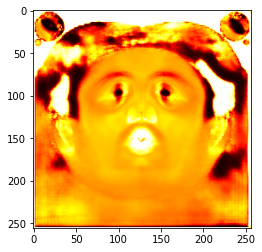

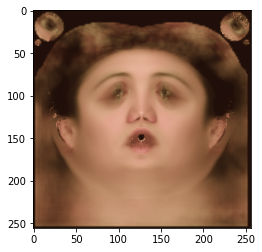

Epoch 81 time elapsed 8.32 sec validation loss 6.776838526129723 loss breakdown [6.136178493499756, 0.6406601667404175]
Epoch 82 time elapsed 105.85 sec training loss 33.16179957985878 loss breakdown [30.446535110473633, 2.715265989303589]
Epoch 83 time elapsed 105.62 sec training loss 33.55162512511015 loss breakdown [30.84008026123047, 2.711561441421509]
Epoch 84 time elapsed 105.56 sec training loss 32.11036666482687 loss breakdown [29.38871955871582, 2.7216596603393555]
Epoch 85 time elapsed 105.57 sec training loss 32.17364951968193 loss breakdown [29.458511352539062, 2.7151567935943604]
saved checkpoint at epoch 85
Epoch 86 time elapsed 106.45 sec training loss 31.86938189715147 loss breakdown [29.153322219848633, 2.716059684753418]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9989, device='cuda:0') tensor(0.3177, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9981, device='cuda:0') tensor(0.1708, device='cuda:0')
sRGB_albedo tensor(0.8268, device='cuda:0') tenso

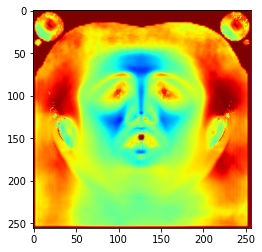

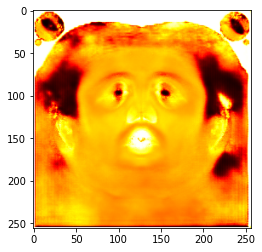

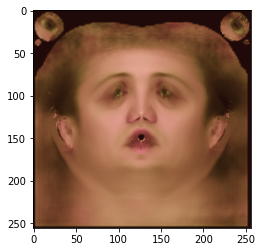

Epoch 86 time elapsed 8.53 sec validation loss 7.621825039386749 loss breakdown [6.972477436065674, 0.649345874786377]
Epoch 87 time elapsed 105.75 sec training loss 31.37263374775648 loss breakdown [28.655099868774414, 2.717532157897949]
Epoch 88 time elapsed 105.75 sec training loss 36.831915095448494 loss breakdown [34.11440658569336, 2.7175023555755615]
Epoch 89 time elapsed 105.72 sec training loss 32.73840752243996 loss breakdown [30.03045082092285, 2.7079572677612305]
Epoch 90 time elapsed 105.76 sec training loss 31.736627116799355 loss breakdown [29.026100158691406, 2.7105183601379395]
saved checkpoint at epoch 90
Epoch 91 time elapsed 106.52 sec training loss 31.352583833038807 loss breakdown [28.63867950439453, 2.713899612426758]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9988, device='cuda:0') tensor(0.2848, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9991, device='cuda:0') tensor(0.1426, device='cuda:0')
sRGB_albedo tensor(0.8550, device='cuda:0') ten

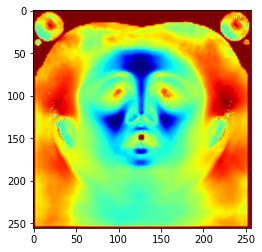

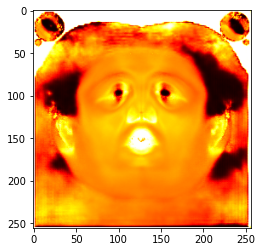

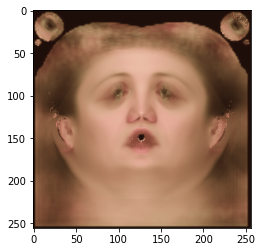

Epoch 91 time elapsed 8.40 sec validation loss 6.56778072565794 loss breakdown [5.927982807159424, 0.6397977471351624]
Epoch 92 time elapsed 105.86 sec training loss 31.40523748844862 loss breakdown [28.68854331970215, 2.716691493988037]
Epoch 93 time elapsed 105.76 sec training loss 30.97511000931263 loss breakdown [28.257394790649414, 2.717711925506592]
Epoch 94 time elapsed 105.57 sec training loss 32.12041972577572 loss breakdown [29.402976989746094, 2.717444896697998]
Epoch 95 time elapsed 105.52 sec training loss 31.521871484816074 loss breakdown [28.798805236816406, 2.723074436187744]
saved checkpoint at epoch 95
Epoch 96 time elapsed 106.38 sec training loss 31.55140022933483 loss breakdown [28.83013153076172, 2.7212719917297363]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9985, device='cuda:0') tensor(0.2885, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9990, device='cuda:0') tensor(0.1507, device='cuda:0')
sRGB_albedo tensor(0.8450, device='cuda:0') tensor

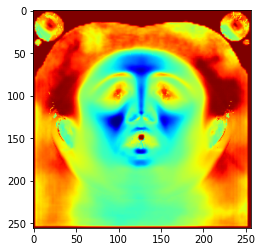

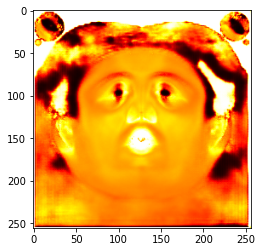

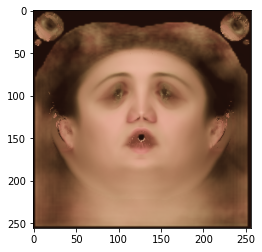

Epoch 96 time elapsed 8.41 sec validation loss 6.3704447746276855 loss breakdown [5.722943305969238, 0.6474998593330383]
Epoch 97 time elapsed 105.55 sec training loss 31.758308544754982 loss breakdown [29.032072067260742, 2.7262251377105713]
Epoch 98 time elapsed 105.53 sec training loss 31.42272040247917 loss breakdown [28.702421188354492, 2.7203056812286377]
Epoch 99 time elapsed 105.50 sec training loss 31.818021319806576 loss breakdown [29.101675033569336, 2.7163503170013428]
Epoch 100 time elapsed 105.50 sec training loss 39.33476270735264 loss breakdown [36.53782653808594, 2.7969131469726562]
saved checkpoint at epoch 100
Epoch 101 time elapsed 106.24 sec training loss 33.54682299494743 loss breakdown [30.799331665039062, 2.747490644454956]
fmel tensor(1., device='cuda:0') tensor(-0.9996, device='cuda:0') tensor(0.2772, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9991, device='cuda:0') tensor(0.1382, device='cuda:0')
sRGB_albedo tensor(0.8585, device='cuda:0') 

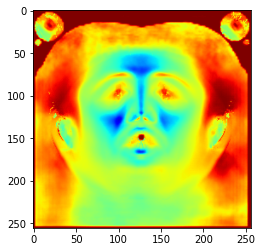

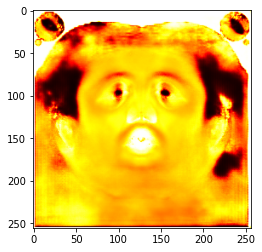

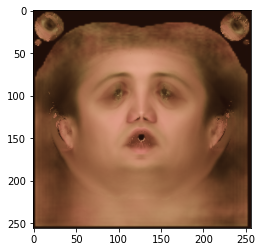

Epoch 101 time elapsed 8.34 sec validation loss 7.292660877108574 loss breakdown [6.6453752517700195, 0.6472845673561096]
Epoch 102 time elapsed 105.53 sec training loss 31.797083728015423 loss breakdown [29.04547882080078, 2.7516112327575684]
Epoch 103 time elapsed 105.56 sec training loss 33.09743572026491 loss breakdown [30.386022567749023, 2.7114198207855225]
Epoch 104 time elapsed 105.59 sec training loss 33.27034217119217 loss breakdown [30.575593948364258, 2.6947553157806396]
Epoch 105 time elapsed 105.52 sec training loss 30.96737200766802 loss breakdown [28.25159454345703, 2.715773344039917]
saved checkpoint at epoch 105
Epoch 106 time elapsed 106.45 sec training loss 30.870654098689556 loss breakdown [28.151508331298828, 2.7191474437713623]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9991, device='cuda:0') tensor(0.2586, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9996, device='cuda:0') tensor(0.0759, device='cuda:0')
sRGB_albedo tensor(0.8666, device='cu

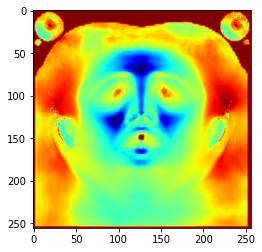

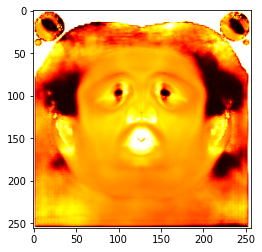

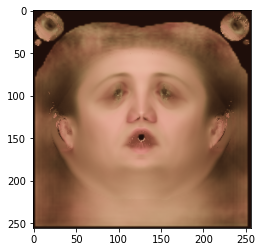

Epoch 106 time elapsed 8.40 sec validation loss 6.6947546526789665 loss breakdown [6.053369998931885, 0.6413832902908325]
Epoch 107 time elapsed 105.69 sec training loss 30.912102691829205 loss breakdown [28.192346572875977, 2.719759464263916]
Epoch 108 time elapsed 105.65 sec training loss 31.19355123490095 loss breakdown [28.47624969482422, 2.717294931411743]
Epoch 109 time elapsed 105.80 sec training loss 31.21059811860323 loss breakdown [28.48624038696289, 2.724344491958618]
Epoch 110 time elapsed 105.74 sec training loss 31.469618260860443 loss breakdown [28.75008201599121, 2.7195382118225098]
saved checkpoint at epoch 110
Epoch 111 time elapsed 106.56 sec training loss 30.762729346752167 loss breakdown [28.039566040039062, 2.7231602668762207]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9995, device='cuda:0') tensor(0.2740, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9993, device='cuda:0') tensor(0.1480, device='cuda:0')
sRGB_albedo tensor(0.8456, device='cuda

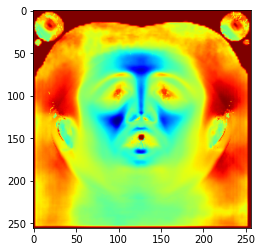

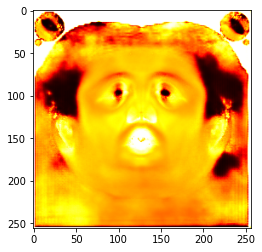

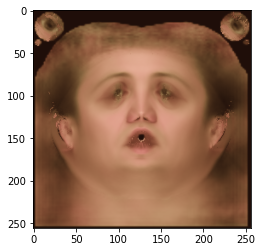

Epoch 111 time elapsed 8.51 sec validation loss 7.354661732912064 loss breakdown [6.703938961029053, 0.6507225632667542]
Epoch 112 time elapsed 105.74 sec training loss 30.782546244561672 loss breakdown [28.059038162231445, 2.7235066890716553]
Epoch 113 time elapsed 105.62 sec training loss 32.61498012393713 loss breakdown [29.846782684326172, 2.768190383911133]
Epoch 114 time elapsed 105.60 sec training loss 33.150380574166775 loss breakdown [30.377302169799805, 2.773071050643921]
Epoch 115 time elapsed 105.60 sec training loss 30.90923221409321 loss breakdown [28.138259887695312, 2.770981788635254]
saved checkpoint at epoch 115
Epoch 116 time elapsed 106.42 sec training loss 31.388074658811092 loss breakdown [28.62221336364746, 2.765859603881836]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9980, device='cuda:0') tensor(0.2709, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9999, device='cuda:0') tensor(0.0975, device='cuda:0')
sRGB_albedo tensor(0.8544, device='cuda

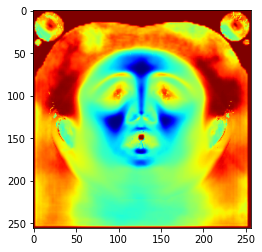

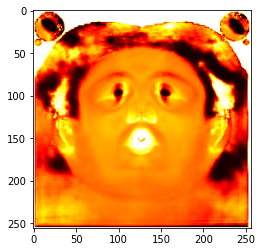

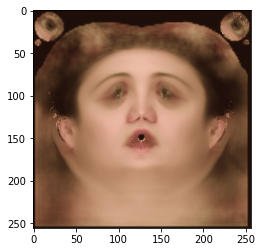

Epoch 116 time elapsed 8.41 sec validation loss 7.305183261632919 loss breakdown [6.653106689453125, 0.6520748734474182]
Epoch 117 time elapsed 105.70 sec training loss 32.478818759322166 loss breakdown [29.716402053833008, 2.7624075412750244]
Epoch 118 time elapsed 105.71 sec training loss 31.922557443380356 loss breakdown [29.1549072265625, 2.767650842666626]
Epoch 119 time elapsed 105.63 sec training loss 31.029127798974514 loss breakdown [28.258718490600586, 2.770392417907715]
Epoch 120 time elapsed 105.54 sec training loss 30.848356194794178 loss breakdown [28.076383590698242, 2.7719621658325195]
saved checkpoint at epoch 120
Epoch 121 time elapsed 106.51 sec training loss 30.455639086663723 loss breakdown [27.6809024810791, 2.774744749069214]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9997, device='cuda:0') tensor(0.2611, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9997, device='cuda:0') tensor(0.1106, device='cuda:0')
sRGB_albedo tensor(0.8474, device='cuda

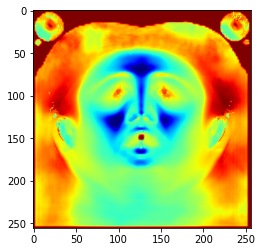

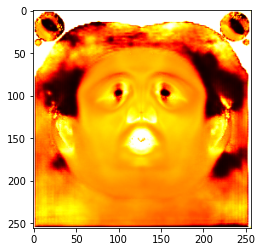

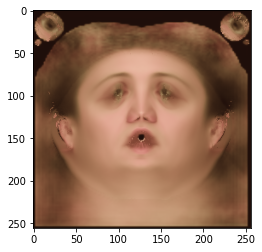

Epoch 121 time elapsed 8.43 sec validation loss 6.322570279240608 loss breakdown [5.662682056427002, 0.6598879098892212]
Epoch 122 time elapsed 105.70 sec training loss 30.888139493763447 loss breakdown [28.110565185546875, 2.7775838375091553]
Epoch 123 time elapsed 105.68 sec training loss 30.77886427938938 loss breakdown [28.003156661987305, 2.7757115364074707]
Epoch 124 time elapsed 105.71 sec training loss 30.751210130751133 loss breakdown [27.97115135192871, 2.7800581455230713]
Epoch 125 time elapsed 105.69 sec training loss 30.307487815618515 loss breakdown [27.524930953979492, 2.782566547393799]
saved checkpoint at epoch 125
Epoch 126 time elapsed 105.93 sec training loss 30.686265863478184 loss breakdown [27.90825653076172, 2.77801513671875]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9995, device='cuda:0') tensor(0.2605, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9998, device='cuda:0') tensor(0.0919, device='cuda:0')
sRGB_albedo tensor(0.8696, device='cud

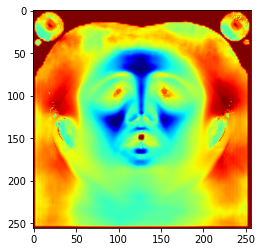

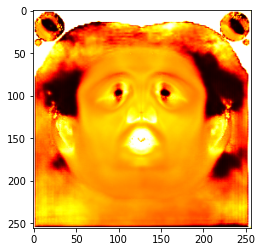

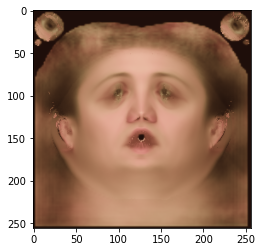

Epoch 126 time elapsed 8.41 sec validation loss 7.080396980047226 loss breakdown [6.426101207733154, 0.6542954444885254]
Epoch 127 time elapsed 105.72 sec training loss 30.3341214209795 loss breakdown [27.551034927368164, 2.7830874919891357]
Epoch 128 time elapsed 105.66 sec training loss 31.2152536585927 loss breakdown [28.433353424072266, 2.781919002532959]
Epoch 129 time elapsed 105.64 sec training loss 30.2777177169919 loss breakdown [27.48699378967285, 2.790721893310547]
Epoch 130 time elapsed 105.73 sec training loss 30.12887714803219 loss breakdown [27.33698844909668, 2.791895627975464]
saved checkpoint at epoch 130
Epoch 131 time elapsed 106.30 sec training loss 30.61566288769245 loss breakdown [27.826351165771484, 2.7893121242523193]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9996, device='cuda:0') tensor(0.3090, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9998, device='cuda:0') tensor(0.1727, device='cuda:0')
sRGB_albedo tensor(0.8279, device='cuda:0') t

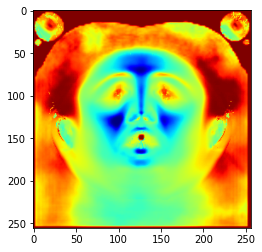

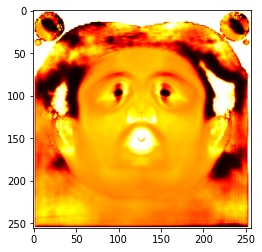

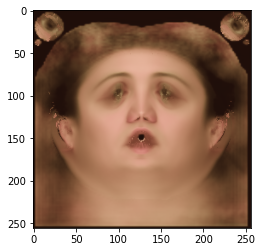

Epoch 131 time elapsed 8.41 sec validation loss 10.666728265583515 loss breakdown [10.007455825805664, 0.659271776676178]
Epoch 132 time elapsed 105.64 sec training loss 30.141183078289032 loss breakdown [27.345521926879883, 2.7956581115722656]
Epoch 133 time elapsed 105.65 sec training loss 30.792385026812553 loss breakdown [27.995397567749023, 2.796980142593384]
Epoch 134 time elapsed 105.62 sec training loss 31.00219515711069 loss breakdown [28.212833404541016, 2.7893738746643066]
Epoch 135 time elapsed 105.66 sec training loss 30.149037539958954 loss breakdown [27.34953498840332, 2.7994954586029053]
saved checkpoint at epoch 135
Epoch 136 time elapsed 106.30 sec training loss 30.05560525506735 loss breakdown [27.245389938354492, 2.8102262020111084]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9996, device='cuda:0') tensor(0.2721, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9998, device='cuda:0') tensor(0.0987, device='cuda:0')
sRGB_albedo tensor(0.8558, device='

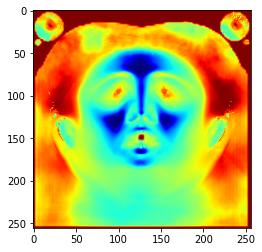

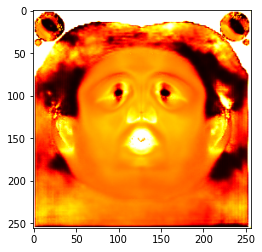

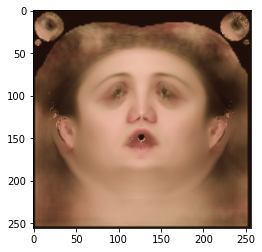

Epoch 136 time elapsed 8.40 sec validation loss 7.98043018579483 loss breakdown [7.304866313934326, 0.6755635142326355]
Epoch 137 time elapsed 105.62 sec training loss 30.090248733758926 loss breakdown [27.28036117553711, 2.809892177581787]
Epoch 138 time elapsed 105.60 sec training loss 29.985583566129208 loss breakdown [27.17149543762207, 2.8140833377838135]
Epoch 139 time elapsed 105.67 sec training loss 30.470730490982533 loss breakdown [27.658023834228516, 2.8127105236053467]
Epoch 140 time elapsed 105.61 sec training loss 30.639934949576855 loss breakdown [27.827377319335938, 2.812551498413086]
saved checkpoint at epoch 140
Epoch 141 time elapsed 106.30 sec training loss 30.406625255942345 loss breakdown [27.59266471862793, 2.8139684200286865]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9992, device='cuda:0') tensor(0.2963, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9998, device='cuda:0') tensor(0.1317, device='cuda:0')
sRGB_albedo tensor(0.8584, device='cud

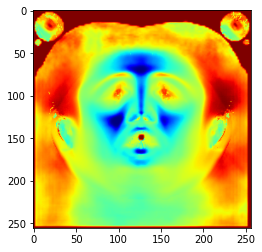

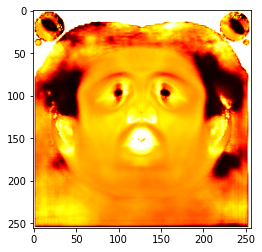

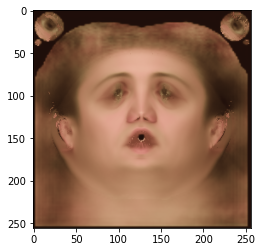

Epoch 141 time elapsed 8.51 sec validation loss 12.718009859323502 loss breakdown [12.039606094360352, 0.6784060001373291]
Epoch 142 time elapsed 105.68 sec training loss 30.02329796552658 loss breakdown [27.207399368286133, 2.815889835357666]
Epoch 143 time elapsed 105.66 sec training loss 29.782242953777313 loss breakdown [26.96528434753418, 2.81695556640625]
Epoch 144 time elapsed 105.67 sec training loss 29.855016738176346 loss breakdown [27.03658103942871, 2.818432569503784]
Epoch 145 time elapsed 105.63 sec training loss 29.94198875129223 loss breakdown [27.125751495361328, 2.8162405490875244]
saved checkpoint at epoch 145
Epoch 146 time elapsed 106.20 sec training loss 29.785244688391685 loss breakdown [26.969284057617188, 2.8159589767456055]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9996, device='cuda:0') tensor(0.2862, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9999, device='cuda:0') tensor(0.1480, device='cuda:0')
sRGB_albedo tensor(0.8490, device='cud

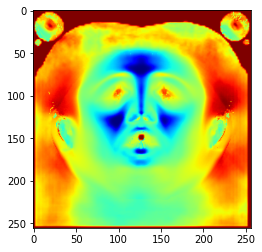

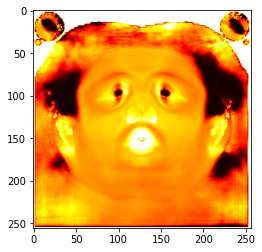

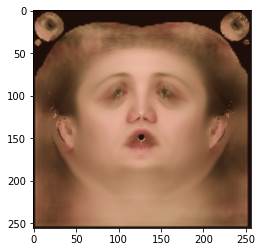

Epoch 146 time elapsed 8.38 sec validation loss 8.547814264893532 loss breakdown [7.881803035736084, 0.666010320186615]
Epoch 147 time elapsed 105.55 sec training loss 29.731521509587765 loss breakdown [26.910030364990234, 2.8214919567108154]
Epoch 148 time elapsed 105.56 sec training loss 29.732001304626465 loss breakdown [26.913532257080078, 2.81846022605896]
Epoch 149 time elapsed 105.53 sec training loss 29.751414380967617 loss breakdown [26.93192481994629, 2.8195042610168457]
Epoch 150 time elapsed 105.53 sec training loss 29.880180530250072 loss breakdown [27.060577392578125, 2.8196046352386475]
saved checkpoint at epoch 150
Epoch 151 time elapsed 105.87 sec training loss 29.67908974736929 loss breakdown [26.861431121826172, 2.817654848098755]
fmel tensor(1., device='cuda:0') tensor(-0.9997, device='cuda:0') tensor(0.3084, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9999, device='cuda:0') tensor(0.1645, device='cuda:0')
sRGB_albedo tensor(0.8294, device='cuda:0'

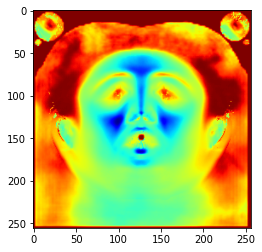

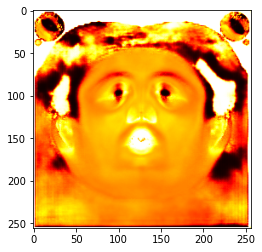

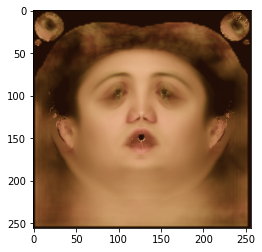

Epoch 151 time elapsed 8.38 sec validation loss 8.134112738072872 loss breakdown [7.464201927185059, 0.6699122786521912]
Epoch 152 time elapsed 105.57 sec training loss 29.75601440668106 loss breakdown [26.935791015625, 2.8202288150787354]
Epoch 153 time elapsed 105.58 sec training loss 29.623126782476902 loss breakdown [26.798858642578125, 2.824258327484131]
Epoch 154 time elapsed 105.37 sec training loss 29.57285149395466 loss breakdown [26.752166748046875, 2.8206896781921387]
Epoch 155 time elapsed 105.24 sec training loss 29.697743222117424 loss breakdown [26.876659393310547, 2.8210813999176025]
saved checkpoint at epoch 155
Epoch 156 time elapsed 106.10 sec training loss 29.672107011079788 loss breakdown [26.849315643310547, 2.822793960571289]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9991, device='cuda:0') tensor(0.2668, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9999, device='cuda:0') tensor(0.1359, device='cuda:0')
sRGB_albedo tensor(0.8570, device='cuda

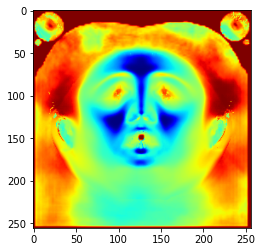

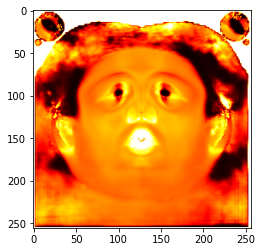

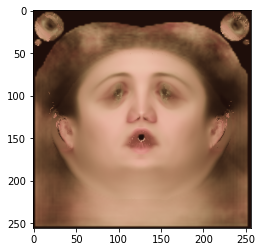

Epoch 156 time elapsed 8.30 sec validation loss 11.672917477786541 loss breakdown [10.99820327758789, 0.6747153997421265]
Epoch 157 time elapsed 105.27 sec training loss 29.56317215412855 loss breakdown [26.744300842285156, 2.8188741207122803]
Epoch 158 time elapsed 105.28 sec training loss 29.54665558040142 loss breakdown [26.72291374206543, 2.823725461959839]
Epoch 159 time elapsed 105.39 sec training loss 29.632809691131115 loss breakdown [26.8077335357666, 2.8250815868377686]
Epoch 160 time elapsed 105.42 sec training loss 29.67594027519226 loss breakdown [26.856830596923828, 2.819105625152588]
saved checkpoint at epoch 160
Epoch 161 time elapsed 105.93 sec training loss 29.52675884962082 loss breakdown [26.705049514770508, 2.8217151165008545]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9995, device='cuda:0') tensor(0.2892, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9999, device='cuda:0') tensor(0.1391, device='cuda:0')
sRGB_albedo tensor(0.8541, device='cuda:

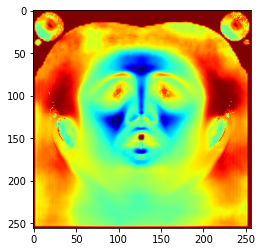

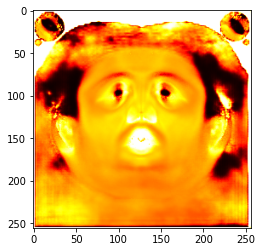

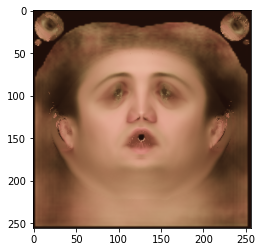

Epoch 161 time elapsed 8.31 sec validation loss 11.367781780660152 loss breakdown [10.691990852355957, 0.6757920980453491]
Epoch 162 time elapsed 105.48 sec training loss 29.497736781835556 loss breakdown [26.6756649017334, 2.822072744369507]
Epoch 163 time elapsed 105.40 sec training loss 29.58934722840786 loss breakdown [26.767858505249023, 2.8214945793151855]
Epoch 164 time elapsed 105.41 sec training loss 29.495635740458965 loss breakdown [26.6731014251709, 2.8225302696228027]
Epoch 165 time elapsed 105.44 sec training loss 29.493557669222355 loss breakdown [26.66878890991211, 2.824777364730835]
saved checkpoint at epoch 165
Epoch 166 time elapsed 106.01 sec training loss 29.463894613087177 loss breakdown [26.638452529907227, 2.8254446983337402]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9998, device='cuda:0') tensor(0.2321, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9999, device='cuda:0') tensor(0.0554, device='cuda:0')
sRGB_albedo tensor(0.8759, device='cud

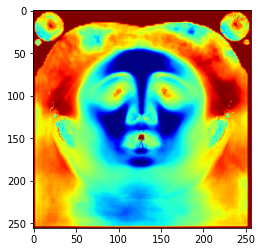

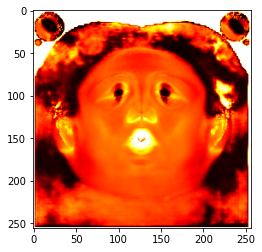

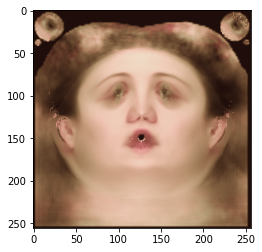

Epoch 166 time elapsed 8.43 sec validation loss 10.236232288181782 loss breakdown [9.56612777709961, 0.6701043248176575]
Epoch 167 time elapsed 105.38 sec training loss 29.48853898793459 loss breakdown [26.66143798828125, 2.827110528945923]
Epoch 168 time elapsed 105.41 sec training loss 29.40928302705288 loss breakdown [26.583724975585938, 2.825563907623291]
Epoch 169 time elapsed 105.43 sec training loss 29.42151403427124 loss breakdown [26.594276428222656, 2.8272314071655273]
Epoch 170 time elapsed 105.40 sec training loss 29.419937819242477 loss breakdown [26.595062255859375, 2.824873924255371]
saved checkpoint at epoch 170
Epoch 171 time elapsed 106.07 sec training loss 29.38594087958336 loss breakdown [26.562475204467773, 2.823477029800415]
fmel tensor(1.0000, device='cuda:0') tensor(-0.9998, device='cuda:0') tensor(0.2783, device='cuda:0')
fblood tensor(1., device='cuda:0') tensor(-0.9999, device='cuda:0') tensor(0.1115, device='cuda:0')
sRGB_albedo tensor(0.8422, device='cuda:0

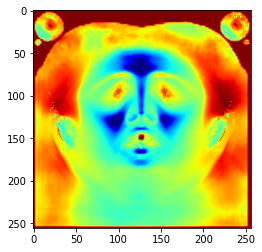

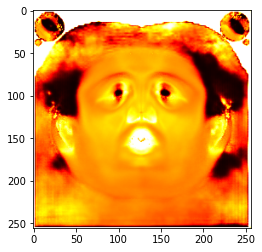

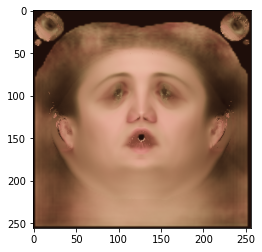

Epoch 171 time elapsed 8.37 sec validation loss 9.119206376373768 loss breakdown [8.451465606689453, 0.6677430868148804]
Epoch 172 time elapsed 105.34 sec training loss 29.366676278412342 loss breakdown [26.542362213134766, 2.824312210083008]
Epoch 173 time elapsed 105.46 sec training loss 29.360214091837406 loss breakdown [26.535268783569336, 2.8249454498291016]
Epoch 174 time elapsed 105.41 sec training loss 29.424860686063766 loss breakdown [26.601818084716797, 2.8230440616607666]


KeyboardInterrupt: ignored

In [ ]:
train_losses = []
val_losses = []
lepoch = -1 #last epoch

'''
use this to load checkpoint if training is interrupted and start from last epoch + 1
checkpoint = torch.load(cpt_path)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
lepoch = checkpoint['epoch']
train_losses = checkpoint['train_losses']
val_losses = checkpoint['val_losses']

'''
if params['pretrain_dir']:
  checkpoint = torch.load(params['pretrain_dir'])
  model.load_state_dict(checkpoint['model_state_dict'])
  optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

for epoch in range(1+lepoch, epochs):
  model.train()
  train_loss = 0.0
  split_loss = torch.zeros(2)
  start = time.time()
  for images in train_loader:      
    images=images.to(device)
    optimizer.zero_grad()
    lightingparameters,b,fmel,fblood,predictedShading,specmask = model.predict(images)
    loss, loss_s, sRGB_albedo, _, _ = calc_loss_modified(images,lightingparameters,b,fmel,fblood,predictedShading,specmask,u)        
    loss.backward()
    optimizer.step()
    train_loss += loss.item()
    split_loss += loss_s
  train_losses.append(train_loss)
  scheduler.step()
  print("Epoch {} time elapsed {:.2f} sec training loss {} loss breakdown {}".format(epoch+1, time.time()-start, train_loss, split_loss.tolist()))

  if (epoch+1)%5==0:
    torch.save({'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'train_losses': train_losses,
                'val_losses' : val_losses
                }, cpt_path)
    print("saved checkpoint at epoch", epoch+1)
  
  if epoch%5 == 0:
    #validation
    model.eval()
    start = time.time()
    with torch.no_grad():
      val_loss = 0.0
      split_loss = torch.zeros(2)
      for batch_idx, images in enumerate(val_loader):       
        images=images.to(device)
        lightingparameters,b,fmel,fblood,predictedShading,specmask = model.predict(images)

        # Use linspace instead
        # fblood = linspace_blood.expand(fblood.shape[0], -1, -1)
        # fmel = linspace_mel.expand(fmel.shape[0], -1, -1)

        loss, loss_s, sRGB_albedo, fmel, fblood = calc_loss_modified(images,lightingparameters,b,fmel,fblood,predictedShading,specmask,u)
        split_loss += loss_s
        val_loss += loss.item()

        if batch_idx == 0:
          print('fmel', torch.max(fmel), torch.min(fmel), torch.mean(fmel))
          print('fblood', torch.max(fblood), torch.min(fblood), torch.mean(fblood))
          print('sRGB_albedo', torch.max(sRGB_albedo), torch.min(sRGB_albedo), torch.mean(sRGB_albedo))
          plt.imshow(cm.jet(0.5*(1+fmel[0]).detach().cpu().numpy()))
          plt.show()
          plt.imshow(cm.hot(0.5*(1+fblood[0]).detach().cpu().numpy()))
          plt.show()
          plt.imshow(torch.clamp(((sRGB_albedo[0].detach())**(1/2.2)).cpu().permute(1, 2, 0), 0, 1).numpy())
          # plt.imshow((sRGB_albedo[0].detach()).cpu().permute(1, 2, 0).numpy())
          plt.show()
      val_losses.append(val_loss)

    print("Epoch {} time elapsed {:.2f} sec validation loss {} loss breakdown {}".format(epoch+1, time.time()-start, val_loss, split_loss.tolist()))

plt.figure()
plt.plot([i+1 for i in range(len(train_losses))] ,train_losses)
plt.title("training loss")
plt.show()

plt.figure()
plt.plot([5*i+4 for i in range(len(val_losses))] ,val_losses)
plt.title("validation loss")
plt.show()